In [111]:
import numpy as np; import scipy as sp; import pandas as pd; import seaborn as sns
import statsmodels.api as sm 
import pylab as py ; import matplotlib.pyplot as plt; import tensorflow as tf
from sklearn import (linear_model, preprocessing, neural_network, pipeline, model_selection)

I will first carry on analysis on the 24 developped and emerging economies looking at the two ends of the yield curve, the 3 month and 5 year, and I will treat **USD United States of America (Developped Economy)** as the domestic country these are done to stay in line with the previous literature (Cerutti et al., 2019; Du et al., 2018; Avdjiev et al., 2017; Liao, 2016; Rime et al., 2017; Hong et al.,2019). 

|               | Asia and Oceania| Europe and Africa| North and South America|
|---------------|-----------------|------------------|------------------------|
| **Emerging**  | KRW South Korea | PLN Poland       | BRL Brazil             |
|               | INR India       | HUF Hungary      | CLP Chile              |
|               | TRY Turkey      | ZAR South Africa | COP Colombia           |
|               | THB Thailand    |                  | MXN Mexico             |
|               | IDR Indonesia   |                  |                        |
|               | PHP Philippines |                  |                        |
|               | MYR Malaysia    |                  |                        |
| **Developped**| JPY Japan       | EUR Eurozone     | CAD Canada             | 
|               | AUD Australia   | GBP United Kindom|                        |
|               | NZD New Zealand | CHF Switzerland  |                        |
|               |                 | SEK Sweden       |                        |
|               |                 | NOK Norway       |                        |



## Data

I sourced interest rate, spot exchange rate, and forward rates from Bloomberg using the functions and securities from the following table

|         | 5 Year Treasury   | 3 Month Treasury| 3 Month Zero Coupon Treasury| 1 Month Deposit| Forward Rates | Spot Rates |
|---------|-------------------|-----------------|-----------------------------|----------------|---------------|------------|
| **KRW** | GTKRW5Y           | C2323M          | KWDRC          | KWDRA          | KWN*t*        | KRW        |
| **INR** | GTINR5Y           | C1233M          | IRDRC          | IRDRA          | IRN*t*        | INR        |
| **MXN** | GTMXN5Y           | C4763M          | MPDRC          | MPDRA          | MXN*t*        | MXN        |
| **BRL** | GEBR5Y            | BV3MBRAZ        | BCDRC          | BCDRA          | BCN*t*        | BRL        |
| **RUB** | GTRUB5Y           | C4963M          | RRDRC          | RRDRA          | RUB*t*        | RUB        |
| **ZAR** | GSAB5YR           | C2623M          | SADRC          | SADRA          | ZAR*t*        | ZAR        |
| **TRY** | GTTRY5Y           | C9653M          | TYDRC          | TYDRA          | TRY*t*        | TRY        |
| **PLN** | GTPLN5Y           | C1193M          | PZDRC          | PZDRA          | PLN*t*        | PLN        |
| **THB** | GTTHB5Y           | C1223M          | TBDRC          | TBDRA          | THB*t*        | THB        |
| **HUF** | GTHUF5Y           | C1143M          | HFDRC          | HFDRA          | HUF*t*        | HUF        |
| **IDR** | GTIDR5Y           | C1323M          | IHDRC          | IHDRA          | IHN*t*        | IDR        |
| **CLP** | GTCLP5Y           | C9963M          | CHDRC          | CHDRA          | CHN*t*        | CLP        |
| **PHP** | GTPHP5Y           | BV3MRPGB        | PPDRC          | PPDRA          | PPN*t*        | PHP        |
| **COP** | GTCOP5Y           | C4773M          | CLDRC          | CLDRA          | CLN*t*        | COP        |
| **MYR** | GTMYR5Y           | C1283M          | MRDRC          | MRDRA          | MRO*t*        | MYR        |
| **GBP** | GTGBP5Y           | C1103M          | BPDRC          | BPDRA          | GBP*t*        | GBP        |
| **CAD** | GTCAD5Y           | C1013M          | CDDRC          | CDDRA          | CAD*t*        | CAD        |
| **CHF** | GTCHF5Y           | C2563M          | SFDRC          | SFDRA          | CHF*t*        | CHF        |
| **NZD** | GTNZD5Y           | C2503M          | NDDRC          | NDDRA          | NZD*t*        | NZD        |
| **SEK** | GTSEK5Y           | C2593M          | SKDRC          | SKDRA          | SEK*t*        | SEK        |
| **NOK** | GTNOK5Y           | C2663M          | NKDRC          | NKDRA          | NOK*t*        | NOK        |
| **EUR** | GTEUR5Y           | C9603M          | EURRC          | EURRA          | EUR*t*        | EUR        |
| **JPY** | GTJPY5Y           | C1053M          | JPYRC          | JPYRA          | JPY*t*        | JPY        |
| **AUD** | GTAUD5Y           | C1273M          | AUDRC          | AUDRA          | AUD*t*        | AUD        |
| **USD** | GT5               | C0823M          | USDRC          | USDRA          | -             | -          |


where *t* is the time horizon (i.e 5Y)

The definition of each function is as follows: 

- GT*: Generic Government Treasury Fixed Income Asset (i.e bonds, bills, notes)
- C...3M: Bloomberg Valuation BVAL of locally denominated 3 month government issued unsecured fixed rate bonds
    - Note for BV3M... the data is only available after 2014
- *RC: The annualized rate of interest that a bank will charge for lending or pay for borrowing a currency for a specific tenor for 3 months.
- *RA: The annualized rate of interest that a bank will charge for lending or pay for borrowing a currency for a specific tenor for 1 month.
- Forwards: Non-deliverable forwards are a type of cash settled financial derivative. In the foreign exchange  market, traders and investors will enter into an outright forward   
  
where * denotes the currencies (i.e USD) and *t* is still time horizon (i.e 5Y)

In [112]:
cutoff_date = "2012-12-31 00:00:00"

#Define a function that checks for missing values
def check_missing(df,date = "2000-01-03 00:00:00"):
    #This function takes in a dataframe and goes
    #through the columns to check for missing values
    for i in range(1,len(list(df.columns.values))):
        if df.isnull().all()[i]:
            print(df.columns[i] + " has no values")
        else:
            first_value_index = df.notna().idxmax()[i]
            if str(df.iloc[first_value_index,0]) != date:
                print("First non-null value in "+ df.columns[i] + " starts on",df.iloc[first_value_index,0])       
    
#Define a function that changes the % rate to decimal rates
def to_rate(df):
    df["5Y"] = np.power((1 + df["5Y"]/100),5) - 1
    df["3M"] = np.power((1 + df["3M"]/100),1/4) - 1
    
#Define a function that calculates the deviation from CIP
def cip(df,currency,horizon):
    #Calculate artificial yield by 
    #spot/forward*(1+foreign yield) - 1 then calculate 
    #deviation from CIP as x = US yield - artificial yield
    forward = currency+horizon
    foreign_rate = horizon+currency
    df["ArtYield"] = ((df[currency]/df[forward])*(1+df[foreign_rate])) - 1
    df["Deviation"] = (df[horizon+"USD"] - df["ArtYield"])*10000

#Define a function that calculates the deviation from CIP and returns the dataframe
def return_cip(df,currency,horizon):
    #Calculate artificial yield by 
    #spot/forward*(1+foreign yield) - 1 then calculate 
    #deviation from CIP as x = US yield - artificial yield
    
    #Limit date to after 2012
    df = df[df["Date"] > pd.to_datetime(cutoff_date)]
    
    #Calculate deviation
    forward = currency+horizon
    foreign_rate = horizon+currency
    df["ArtYield"] = ((df[currency]/df[forward])*(1+df[foreign_rate])) - 1
    df[currency] = (df[horizon+"USD"] - df["ArtYield"])*10000
    
    return df[currency]

#Define a function that plots the plots the deviation from CIP
def plot_cip(df,currency,horizon):
    #Takes the data frame and plots the deviation data
    #Calculate deviation from CIP as x = US yield - artificial yield
    cip(df,currency,horizon)
    
    #Calculate rolling average to smooth out data
    #df["Rolling"] = df["Deviation"].rolling(7).mean()
    
    #Limit date to after 2012
    df = df.where(df["Date"] > pd.to_datetime(cutoff_date))
    
    #Remove outliers
    df = df[df["Deviation"].between(df["Deviation"].quantile(.01), df["Deviation"].quantile(.99))]
    
    #Find the min and max x values
    min_x = df["Date"].head(1)
    max_x = df["Date"].tail(1)
    
    #Plot figure
    fig, ax = plt.subplots(figsize=(15,6))
    df.plot(x="Date",y="Deviation", ax=ax,legend=False).hlines(0,min_x,max_x,color = "Red")
    ax.set_title(currency +" "+ horizon)
    ax.set_ylabel("Basis Points")
    
#Define a function that plots the plots the deviation from CIP
def plot_rate(df,currency,horizon,source):
    #Takes the data frame and plots the rate data
    
    #Plot figure
    fig, ax = plt.subplots(figsize=(15,6))
    df.plot(x="Date",y=horizon, ax=ax,legend=False)
    ax.set_title(currency +" "+ horizon+" "+ source)
    ax.set_ylabel("Rate")

### Exchange Rates
Spot exchange rate is denominated in USD (i.e USDJPY, how many JPY 1 USD buys), and forward rates are also denominated in USD.

In [113]:
path = "D:\Downloads\Econ490"

f3m = pd.read_csv(path+r"\Forward 3m.csv", parse_dates=["Date"])
f3m.name = "3 Month Forward"

f5y = pd.read_csv(path+r"\Forward 5y.csv", parse_dates=["Date"])
f5y.name = "5 Year Forward"

spot = pd.read_csv(path+r"\Spot.csv", parse_dates=["Date"])
spot.name = "Spot Exchange Rate"

for df in [f3m,f5y]:
    print("In dataframe " + df.name)
    check_missing(df)
    print("")
    
date = pd.DataFrame(f3m["Date"])

In dataframe 3 Month Forward
First non-null value in BRL starts on 2000-02-11 00:00:00
First non-null value in RUB starts on 2001-08-09 00:00:00
First non-null value in HUF starts on 2001-01-26 00:00:00
First non-null value in IDR starts on 2004-02-04 00:00:00
First non-null value in MYR starts on 2005-04-20 00:00:00

In dataframe 5 Year Forward
First non-null value in MXN starts on 2002-06-07 00:00:00
First non-null value in BRL starts on 2002-06-11 00:00:00
First non-null value in RUB starts on 2005-08-30 00:00:00
First non-null value in ZAR starts on 2004-06-18 00:00:00
First non-null value in TRY starts on 2003-07-25 00:00:00
First non-null value in PLN starts on 2004-06-18 00:00:00
THB has no values
First non-null value in HUF starts on 2004-06-18 00:00:00
First non-null value in IDR starts on 2001-04-18 00:00:00
First non-null value in CLP starts on 2000-09-11 00:00:00
COP has no values
MYR has no values
First non-null value in CAD starts on 2000-10-20 00:00:00



There are problems with 5 year forward rates, it seems that many emerging economies have no 5 year forward rates, specifically THB, COP, MYR has no 5 year forward rates. This will limit my analysis on the right end of the yield curve. I will look further into trying to source data for these countries or use a shorter maturity for my next interim report. I will create a master exchange rate data frame

In [114]:
fx = spot.merge(f3m.merge(f5y,on = "Date",suffixes=["3M","5Y"]),on = "Date")
fx.tail(1)

,Date,KRW,INR,MXN,BRL,RUB,ZAR,TRY,PLN,THB,...,MYR5Y,EUR5Y,JPY5Y,GBP5Y,AUD5Y,CAD5Y,CHF5Y,NZD5Y,SEK5Y,NOK5Y
5443,2020-11-12,1114.9,74.6463,20.6308,5.4575,77.3568,15.649,7.6931,3.8049,30.28,...,NaN,0.803664,100.4689,0.751779,1.377532,1.32676,0.861926,1.464011,8.470229,9.274315


D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


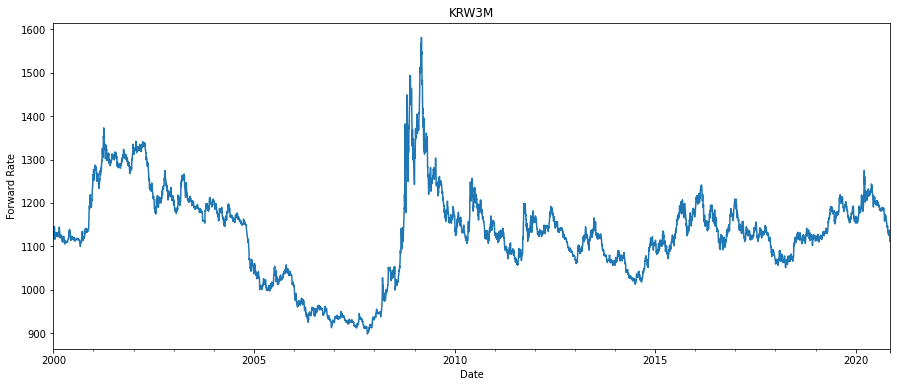

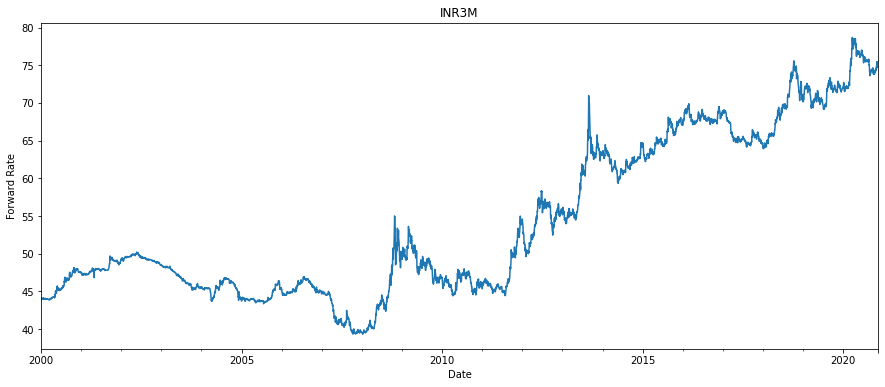

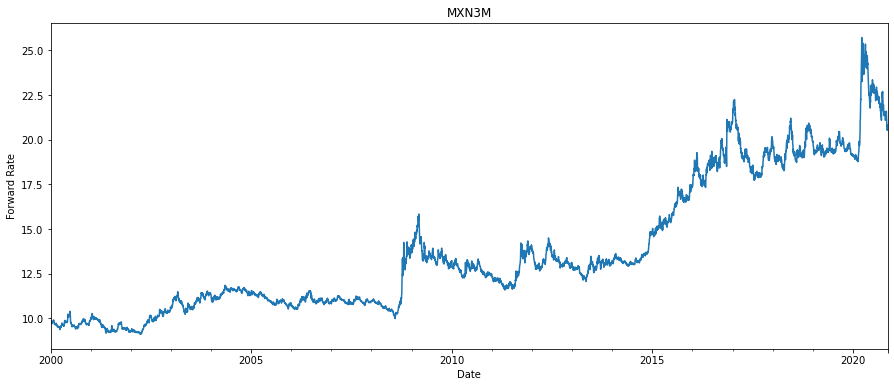

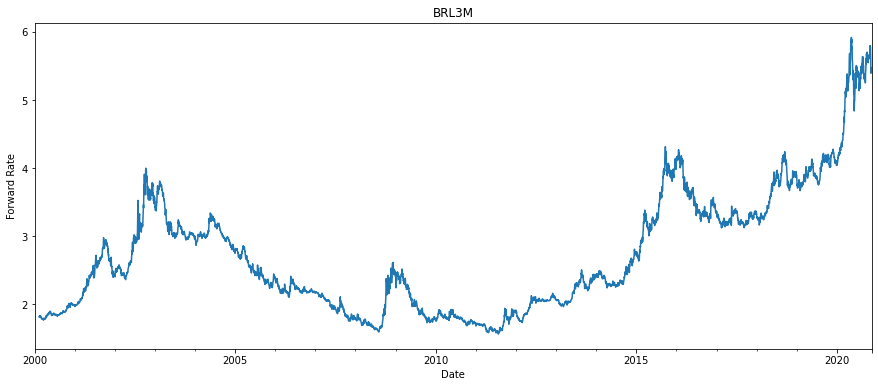

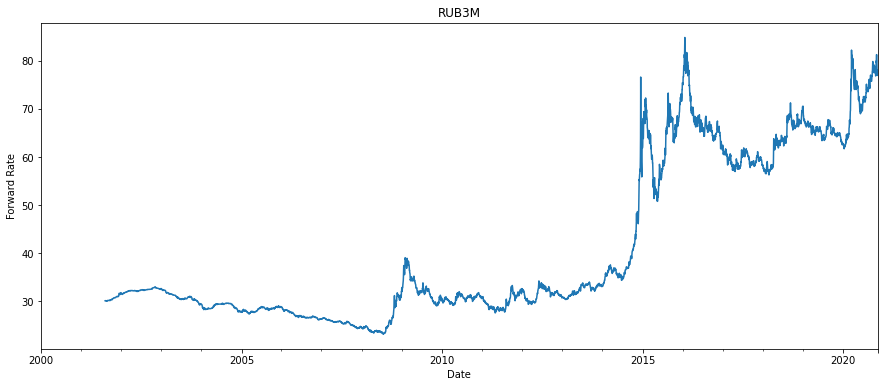

...

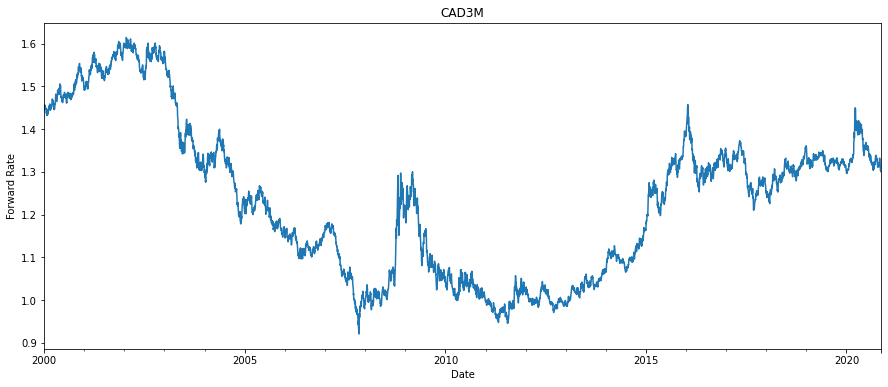

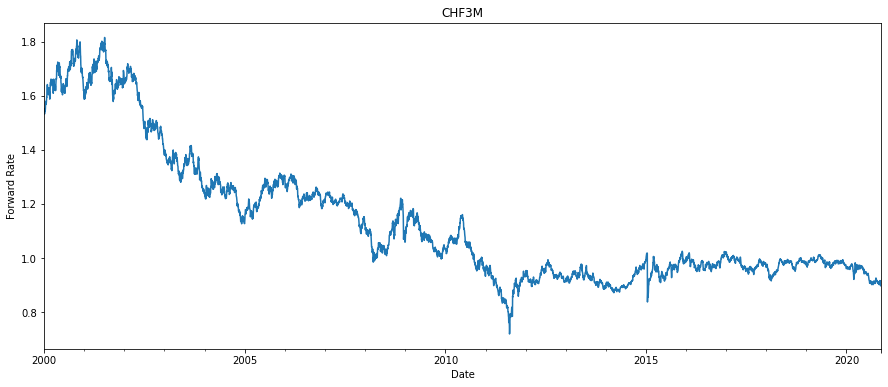

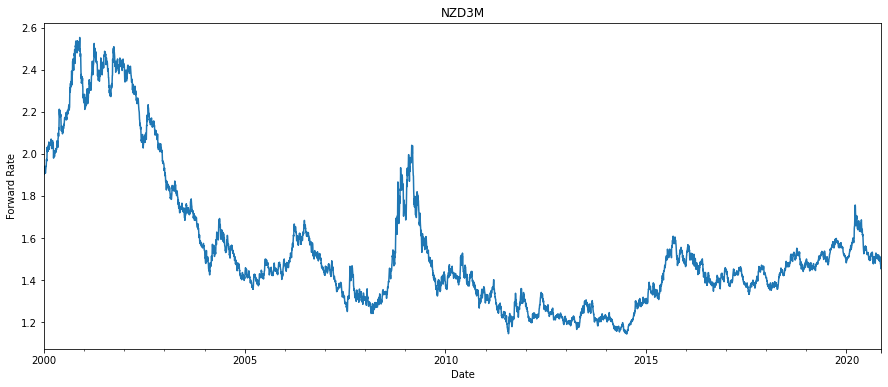

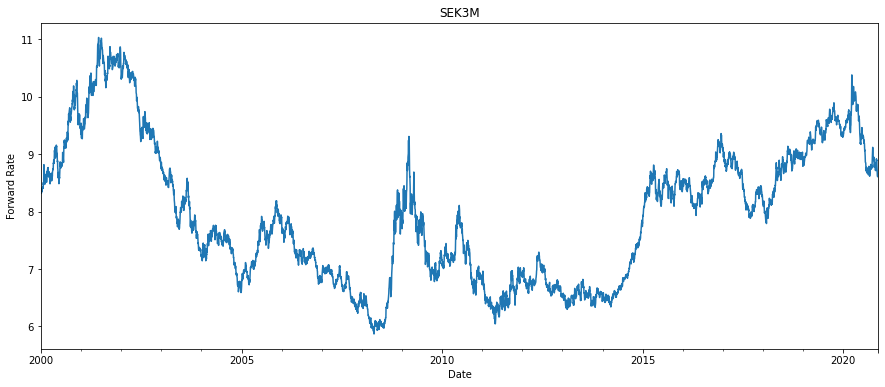

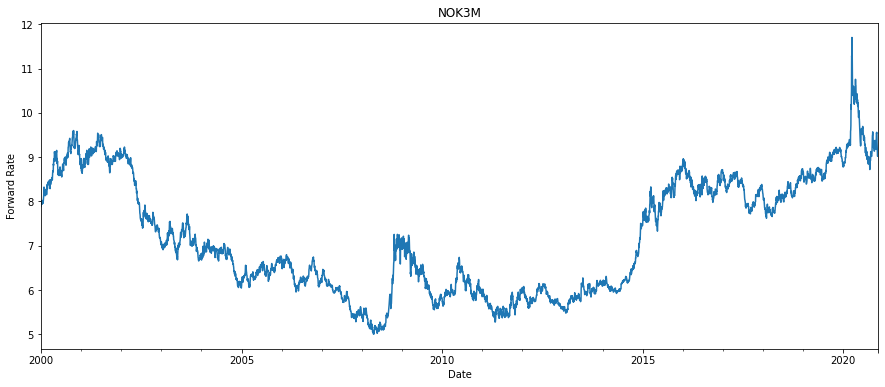

In [115]:
horizon = "3M"

for columns in [col for col in fx.columns if horizon in col]:
    fig, ax = plt.subplots(figsize=(15,6))
    fx.plot(x="Date",y=columns, ax=ax,legend=False)
    ax.set_title(columns)
    ax.set_ylabel("Forward Rate")

There seems to be some issue with early 2000 THB, and pre 2012 MYR data, however, my analysis focuses on post 2012 so it will not interfere with my analysis. 

### Interest Rates

Interest rate is the most problematic issue in the analysis, there is a plethora of methods to measure interest rate. I have sourced 3 data for 3 month and 5 year rates from bloomberg and will compare to determine which source to use. The most important thing will be comparing within the same data source (i.e if I use datasource 1 for EUR, then I should compare to datasource 1 for USD), this is to control measurement error.

In [116]:
pathc = "D:\Downloads\Econ490\Rates\C"
pathi = "D:\Downloads\Econ490\Rates\I"
pathf = "D:\Downloads\Econ490\Rates\F"

D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


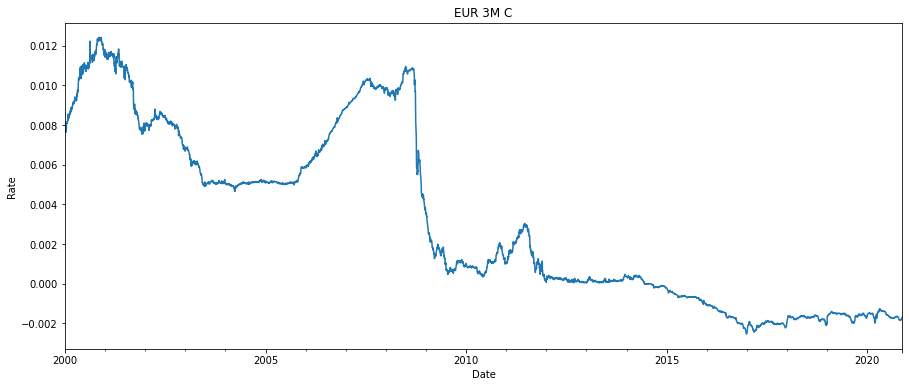

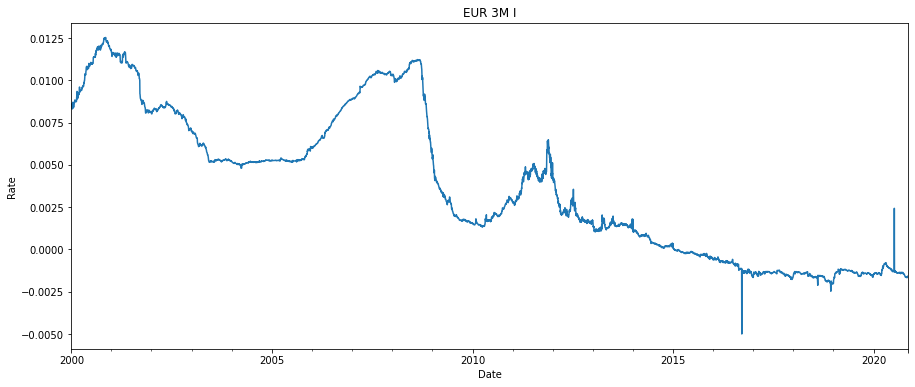

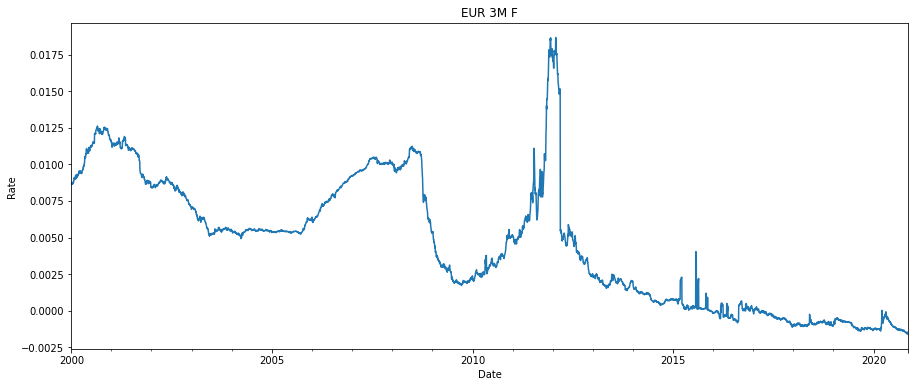

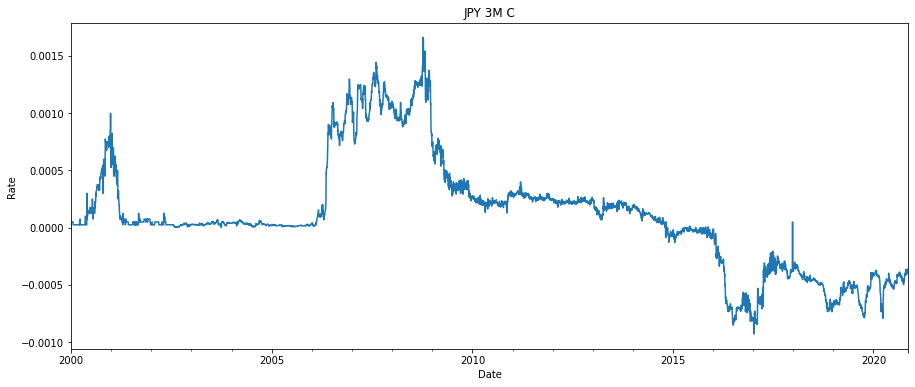

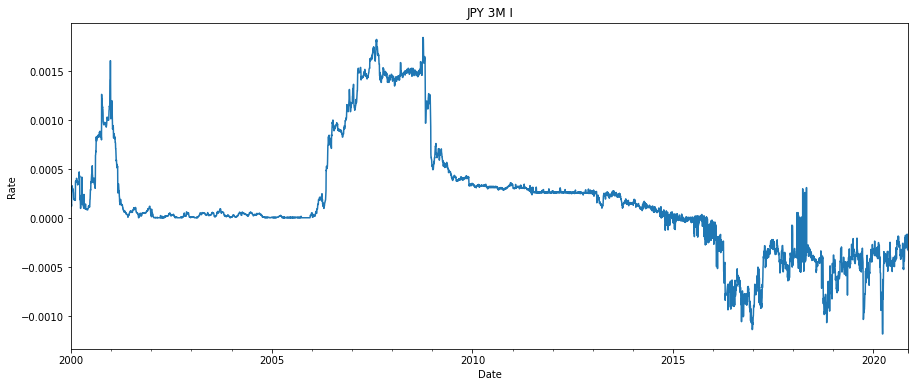

...

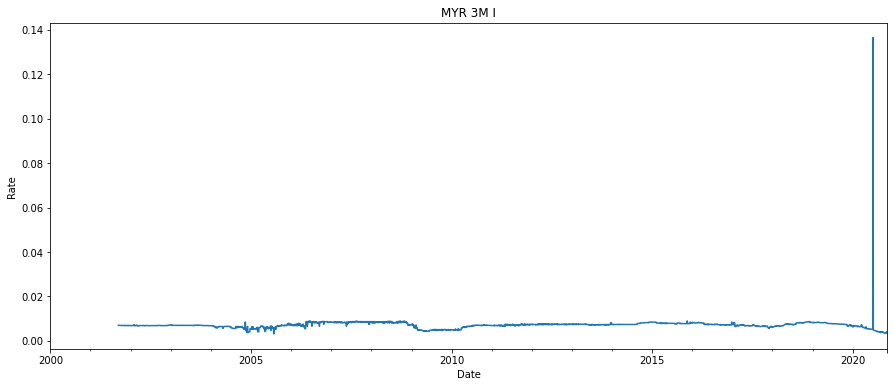

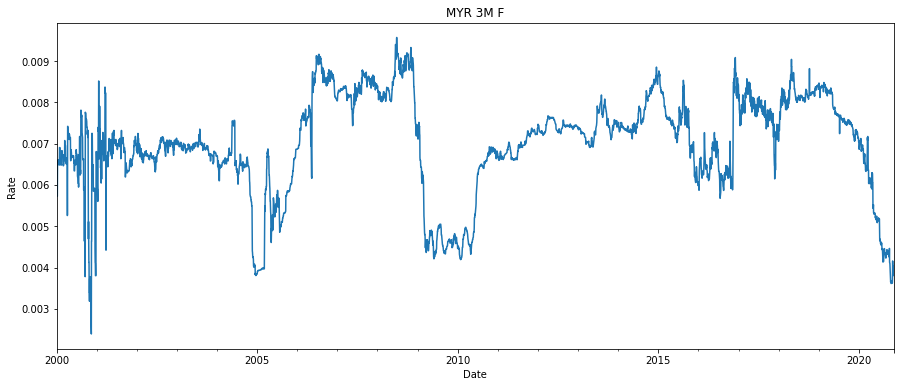

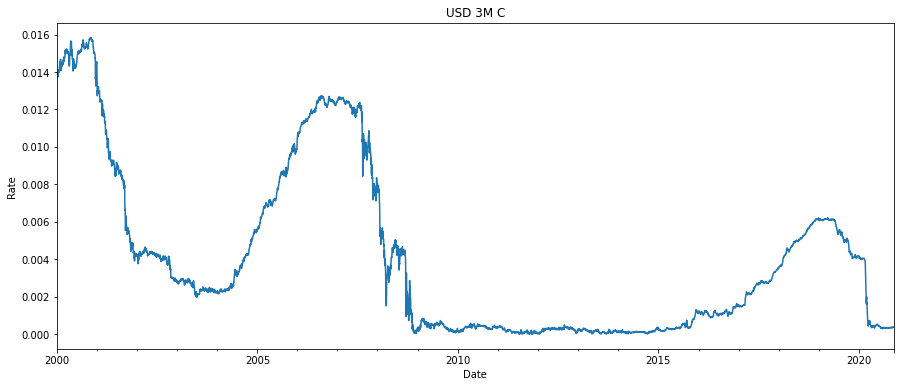

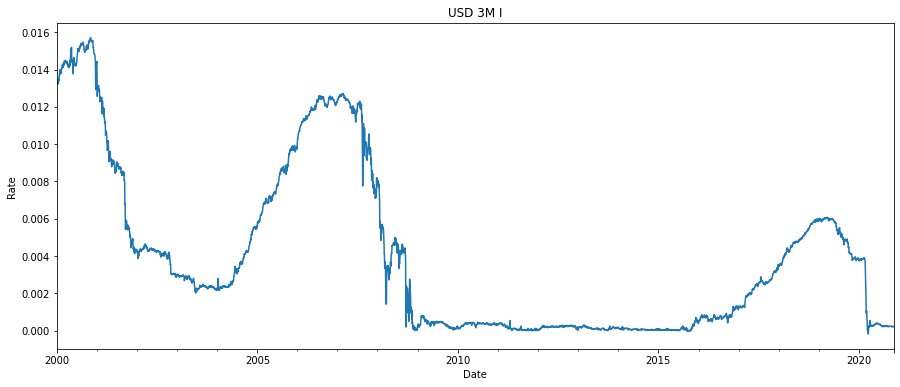

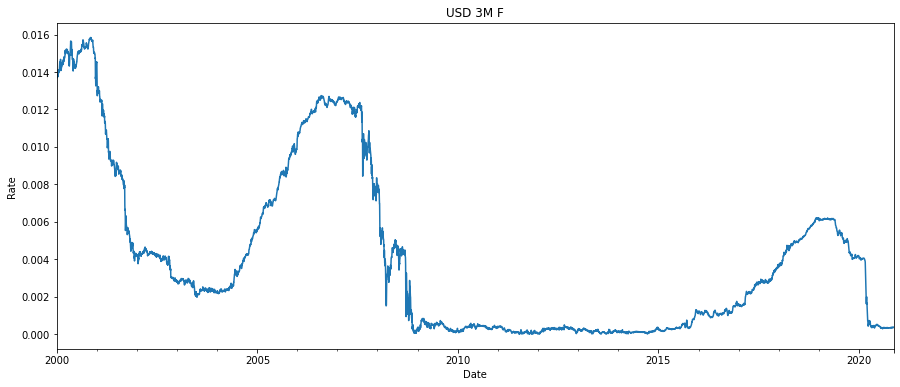

In [117]:
countries = [r"\EUR",r"\JPY",r"\GBP",r"\AUD",r"\CAD",r"\CHF",r"\NZD",r"\SEK",\
             r"\NOK",r"\KRW",r"\INR",r"\MXN",r"\BRL",r"\RUB",r"\ZAR",r"\TRY",\
             r"\PLN",r"\THB",r"\HUF",r"\IDR",r"\CLP",r"\PHP",r"\COP",r"\MYR",\
             r"\USD"]
C = [pathc + c +".csv" for c in countries]
I = [pathi + c +".csv" for c in countries]
F = [pathf + c +".csv" for c in countries]
rates = [i for l in zip(C, I, F) for i in l]
horizon = "3M"

for c in rates:
    df = pd.read_csv(c,parse_dates=["Date"])
    currency = c[-7:-4]
    source = c[-9]
    
    to_rate(df)
    
    plot_rate(df,currency,horizon,source)

It is difficult to choose the "best" datasource because it is hard to define the criteria for best. If I base my decision on having the smallest variance then I run into the risk where I choose the datasource where rates stay constant for a long time. If I base my decision on choosing the datasource with the smallest number of outliers I run the risk of filtering out actual extreme changes. Thus I will "eyeball" the "optimal" datasource. Fortunately, most of the currencies seem to have at least one datasource that seems relatively accurate. However, I run into problems with CLP and PHP, I have no solution yet, so I will drop them from the analysis until I can find an accurate datasource. 

|C        |F       |
|---------|--------|
| **KRW** | **JPY**| 
| **INR** | **GBP**| 
| **EUR** | **AUD**| 
| **BRL** | **NOK**| 
| **SEK** | **MXN**| 
| **NZD** | **RUB**| 
| **CHF** | **ZAR**| 
| **CAD** | **TRY**| 
| **THB** | **PLN**| 
| **IDR** | **HUF**| 
| **USD** | **COP**| 
|         | **MYR**| 
|         | **USD**| 

## Analysis

EUR: Mean (sd) deviation in basis point post 2012 = -3.74 (3.21)
JPY: Mean (sd) deviation in basis point post 2012 = -9.85 (5.09)
GBP: Mean (sd) deviation in basis point post 2012 = -1.86 (3.87)
AUD: Mean (sd) deviation in basis point post 2012 = -0.1 (3.27)
CAD: Mean (sd) deviation in basis point post 2012 = -3.65 (3.6)
CHF: Mean (sd) deviation in basis point post 2012 = -9.37 (4.65)
NZD: Mean (sd) deviation in basis point post 2012 = 4.26 (4.07)
SEK: Mean (sd) deviation in basis point post 2012 = -2.11 (6.34)
NOK: Mean (sd) deviation in basis point post 2012 = 0.3 (3.9)
KRW: Mean (sd) deviation in basis point post 2012 = -8.39 (30.79)
INR: Mean (sd) deviation in basis point post 2012 = -9.46 (35.25)
MXN: Mean (sd) deviation in basis point post 2012 = -4.27 (10.46)
RUB: Mean (sd) deviation in basis point post 2012 = 16.81 (42.53)
ZAR: Mean (sd) deviation in basis point post 2012 = 5.43 (8.42)
TRY: Mean (sd) deviation in basis point post 2012 = 23.71 (53.93)
PLN: Mean (sd) deviation in

D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


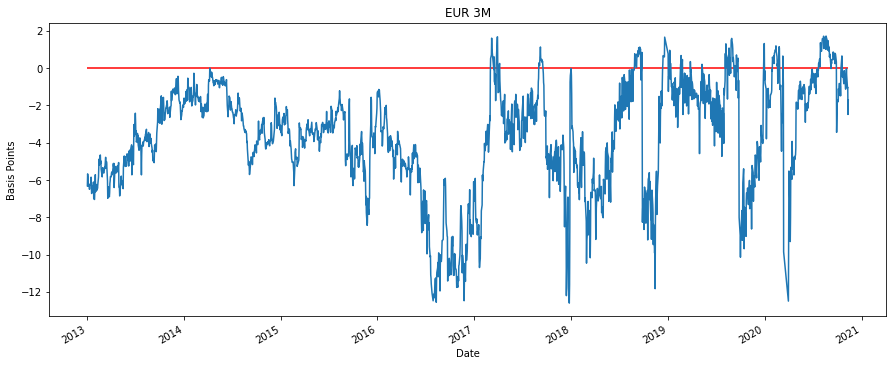

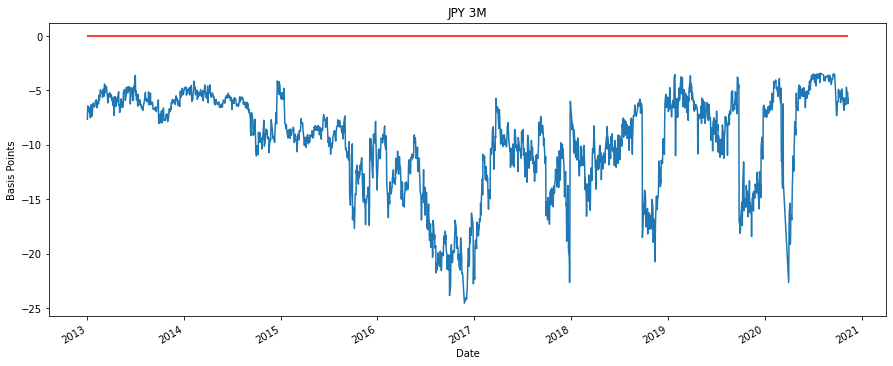

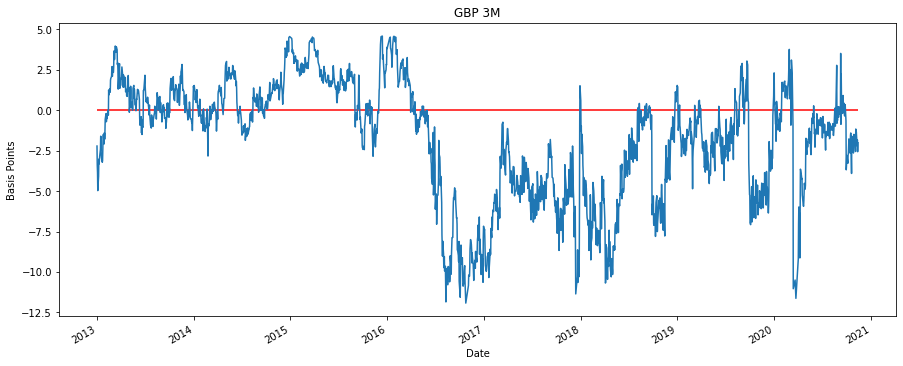

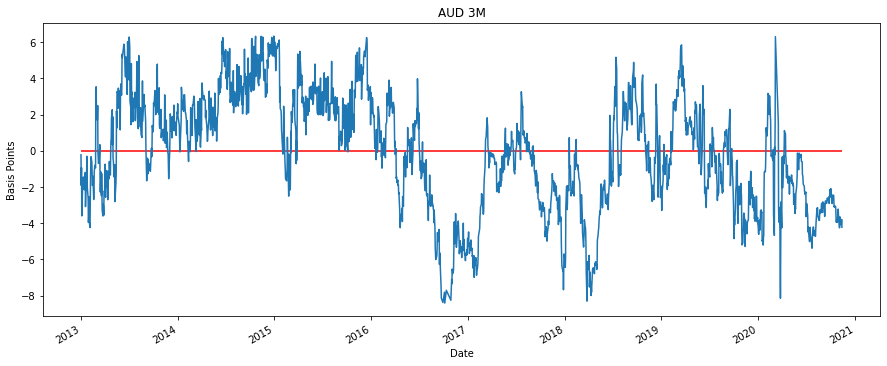

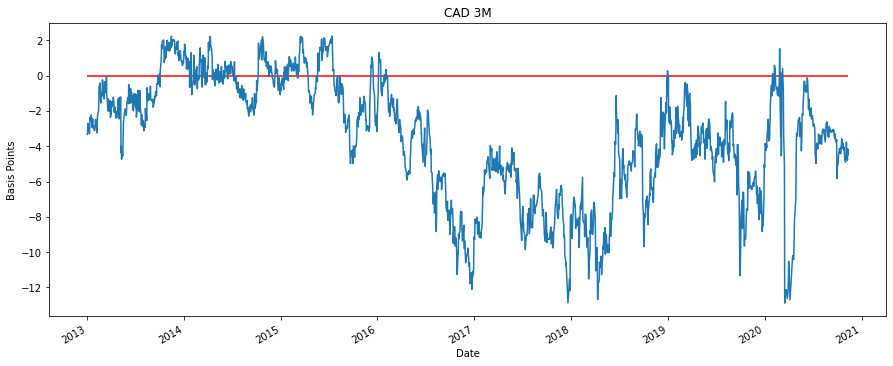

...

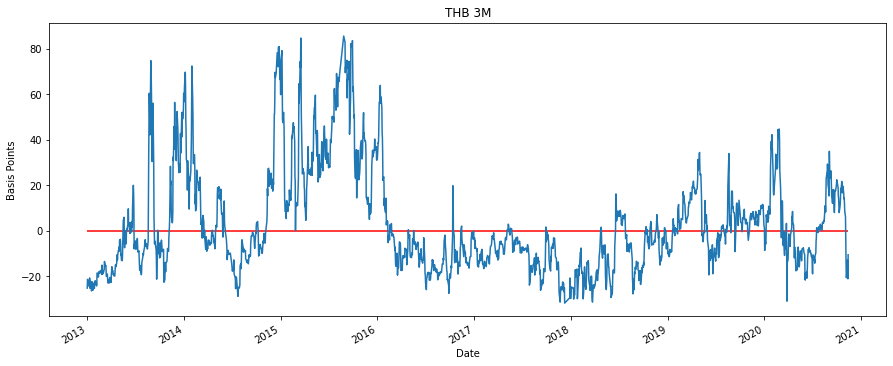

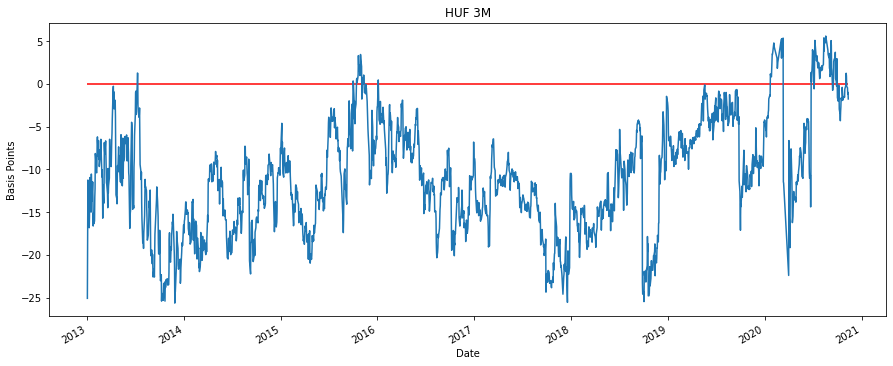

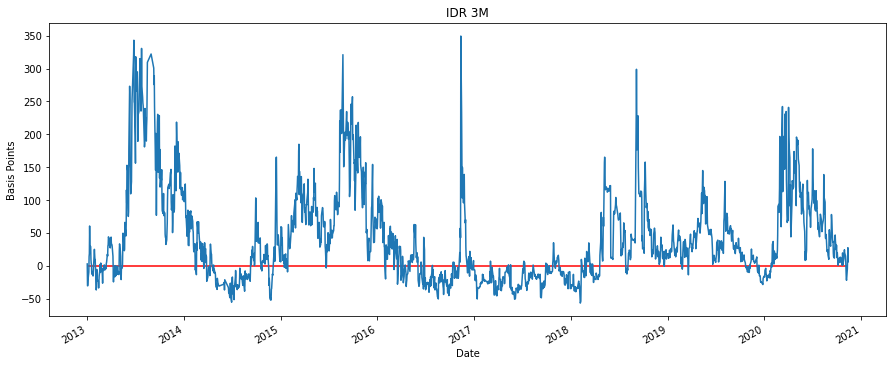

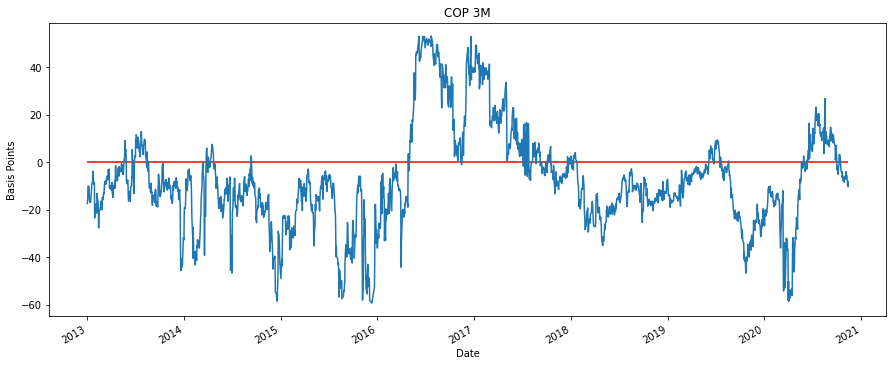

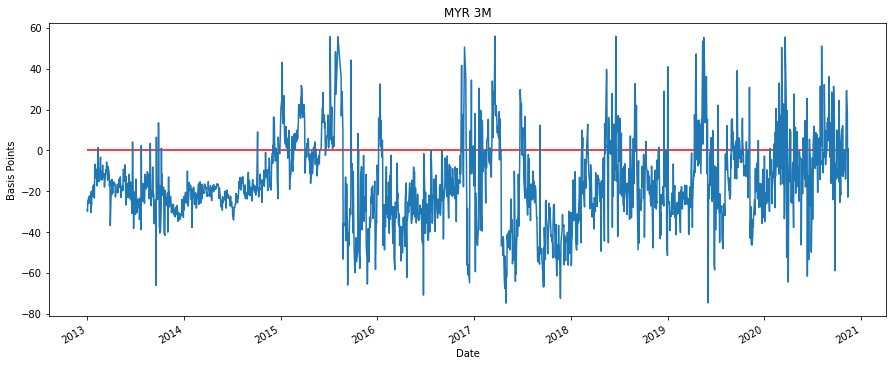

In [118]:
path = "D:\Downloads\Econ490\Rates"

countries = [r"\C\EUR",r"\F\JPY",r"\F\GBP",r"\C\AUD",r"\C\CAD",r"\C\CHF",r"\C\NZD",r"\C\SEK",\
             r"\C\NOK",r"\F\KRW",r"\C\INR",r"\C\MXN",r"\C\RUB",r"\C\ZAR",r"\C\TRY",\
             r"\C\PLN",r"\C\THB",r"\C\HUF",r"\C\IDR",r"\C\COP",r"\C\MYR"]
rates = [path + c +".csv" for c in countries]
horizon = "3M"


for c in rates:
    df = pd.read_csv(c,parse_dates=["Date"])
    currency = c[-7:-4]
    source = c[-9]
    
    to_rate(df)
    
    if source == "C":
        USD = pd.read_csv(path+r"\C\USD.csv",parse_dates=["Date"])
        to_rate(USD)
        
        m3 = df[["Date",horizon]].merge(fx[["Date",currency,currency+horizon]], on = "Date")\
        .merge(USD[["Date",horizon]], on = "Date", suffixes = [currency,"USD"])
        
    else:
        USD = USD = pd.read_csv(path+r"\F\USD.csv",parse_dates=["Date"])
        to_rate(USD)
        
        m3 = df[["Date",horizon]].merge(fx[["Date",currency,currency+horizon]], on = "Date")\
        .merge(USD[["Date",horizon]], on = "Date", suffixes = [currency,"USD"])
    
    plot_cip(m3,currency,horizon)
    
    #avg = np.round(np.mean(m3[(m3['Date'] > pd.to_datetime("2009-12-31").date()) & (m3['Date'] < pd.to_datetime("2016-9-16").date())]["Deviation"]),2)
    avg = np.round(np.mean(m3[(m3['Date'] > pd.to_datetime(cutoff_date))]["Deviation"]),2)
    sd = np.round(np.std(m3[(m3['Date'] > pd.to_datetime(cutoff_date))]["Deviation"]),2)
    print(currency + ": Mean (sd) deviation in basis point post 2012 =" + " "+ str(avg) + " ("+ str(sd)+ ")")

BRL is the only currency with some missing data, from 2012 - 2014, I will exclude BRL for now.

In [119]:
#Create dataframe with all deviations
#emerging = ["MYR","COP","IDR","HUF","THB","PLN","TRY","ZAR","RUB","MXN","INR","KRW"]
#developped = ["EUR","JPY","GBP","AUD","CAD","CHF","NZD","SEK","NOK"]
asia = ["KRW","INR","TRY","THB","IDR","MYR"]
europe_africa = ["RUB","ZAR","PLN", "HUF"]
americas = ["MXN","COP"]
country = emerging+developped

deviations = date[date["Date"] > pd.to_datetime(cutoff_date)]
#deviations["Emerging"] = 0
#deviations["Developped"] = 0

for c in rates:
    df = pd.read_csv(c,parse_dates=["Date"])
    currency = c[-7:-4]
    source = c[-9]
    
    to_rate(df)
    
    if source == "C":
        USD = pd.read_csv(path+r"\C\USD.csv",parse_dates=["Date"])
        to_rate(USD)
        
        m3 = df[["Date",horizon]].merge(fx[["Date",currency,currency+horizon]], on = "Date")\
        .merge(USD[["Date",horizon]], on = "Date", suffixes = [currency,"USD"])
        
    else:
        USD = USD = pd.read_csv(path+r"\F\USD.csv",parse_dates=["Date"])
        to_rate(USD)
        
        m3 = df[["Date",horizon]].merge(fx[["Date",currency,currency+horizon]], on = "Date")\
        .merge(USD[["Date",horizon]], on = "Date", suffixes = [currency,"USD"])
    
    df = return_cip(m3,currency,horizon)
    deviations = deviations.join(df)
    
#for columns in deviations:
#        if columns in emerging:
#            deviations["Emerging"] += deviations[columns]/len(emerging)
#        elif columns in developped:
#            deviations["Developped"] += deviations[columns]/len(developped)

deviations

D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Date,EUR,JPY,GBP,AUD,CAD,CHF,NZD,SEK,NOK,...,MXN,RUB,ZAR,TRY,PLN,THB,HUF,IDR,COP,MYR
3391,2013-01-01,-6.309617,-7.650451,-2.211289,-0.219121,-3.326912,-14.290401,-2.356360,5.217336,-1.766806,...,-23.123403,15.379764,8.586414,-23.421878,12.395749,-25.328351,-25.093058,2.690380,-17.435792,-28.883934
3392,2013-01-02,-5.672420,-6.683606,-3.399467,-1.904175,-3.177765,-13.606919,-0.451655,5.156982,-2.039099,...,-20.590748,15.167746,8.669161,-22.655755,16.781173,-21.475431,-17.885158,-30.583835,-16.821274,-29.862061
3393,2013-01-03,-5.821815,-6.418783,-3.842970,-0.927793,-2.700002,-12.028048,-0.528042,4.791998,-1.651843,...,-20.556562,14.521568,7.491504,-23.242717,14.683886,-21.751079,-11.243674,-30.560115,-14.928224,-25.304755
3394,2013-01-04,-6.332987,-6.874177,-4.969558,-3.592612,-3.135426,-11.936020,-0.975748,3.309326,-1.957363,...,-21.710548,15.171281,5.734103,-24.102732,12.887027,-23.361648,-15.290583,-21.277109,-10.074977,-24.448843
3395,2013-01-07,-6.219172,-6.560484,-4.076503,-2.055599,-3.082002,-11.201657,-0.701284,5.081339,-1.517734,...,-22.010619,15.307234,5.780084,-25.290286,13.122926,-24.335363,-15.527253,-9.618889,-10.284402,-22.924543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5439,2020-11-06,-0.405445,-5.068376,-1.332646,-3.893729,-4.254121,-4.570346,-1.486422,1.984431,3.512811,...,-3.430202,-15.162037,25.130681,23.583220,-1.537835,-20.360487,-0.287508,-22.224564,-5.515442,29.302207
5440,2020-11-09,-1.068148,-5.172283,-2.195317,-4.095720,-4.793567,-5.272567,-1.092514,1.408496,3.956917,...,-3.727143,-13.578474,28.336070,-5.793903,-1.043524,-13.067770,-0.442522,-4.706724,-8.040130,18.721091
5441,2020-11-10,-1.037715,-5.240726,-1.831273,-4.060684,-4.152744,-4.678277,-1.284970,1.342679,3.877574,...,0.953011,-14.440289,27.663846,-22.108993,-0.755564,-17.341829,-1.212963,9.941544,-9.921467,-13.537675
5442,2020-11-11,-2.487943,-6.225991,-2.563481,-3.788348,-4.419962,-5.424701,-3.247913,1.113055,1.786478,...,0.507151,-12.805510,35.638156,-11.387780,-0.804393,-21.239270,-0.988896,27.359267,-8.028000,-22.911666


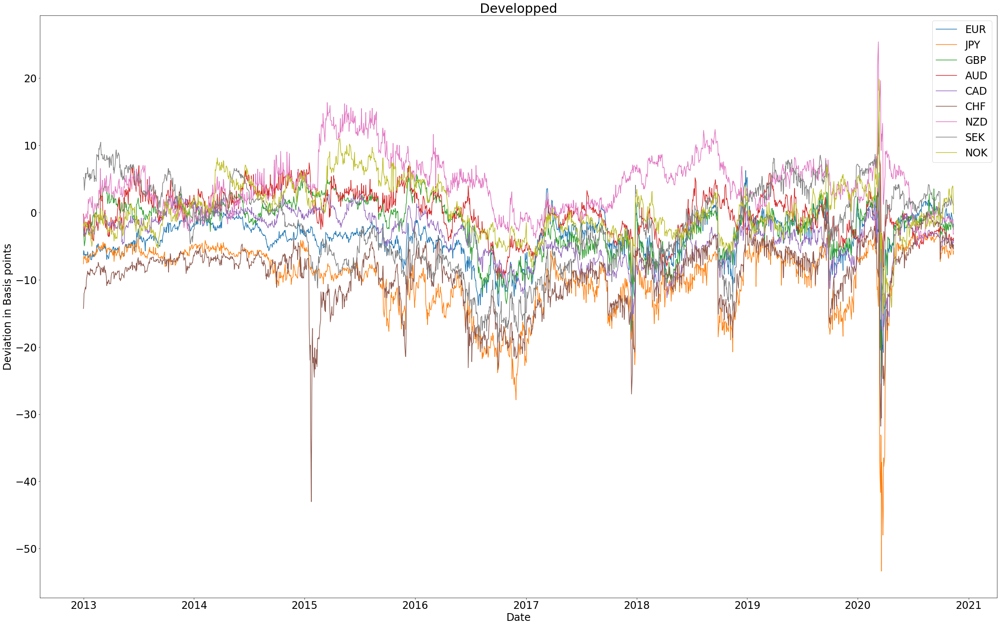

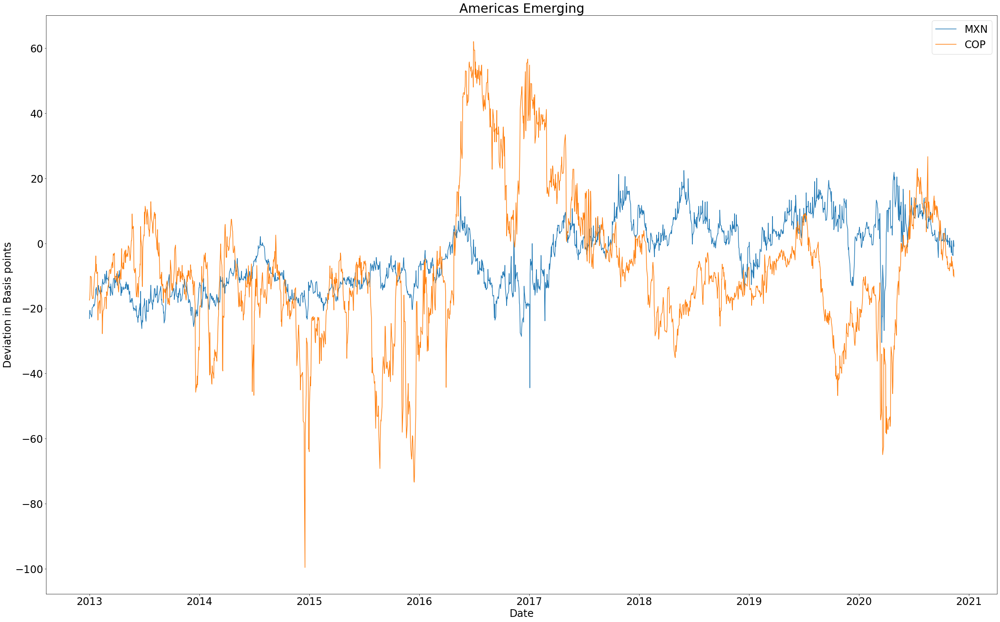

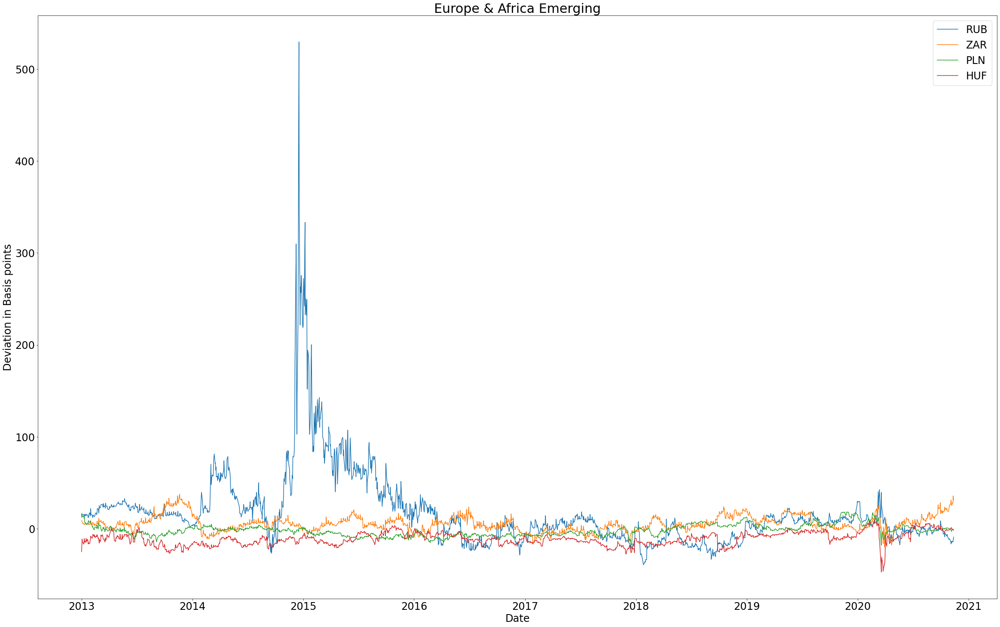

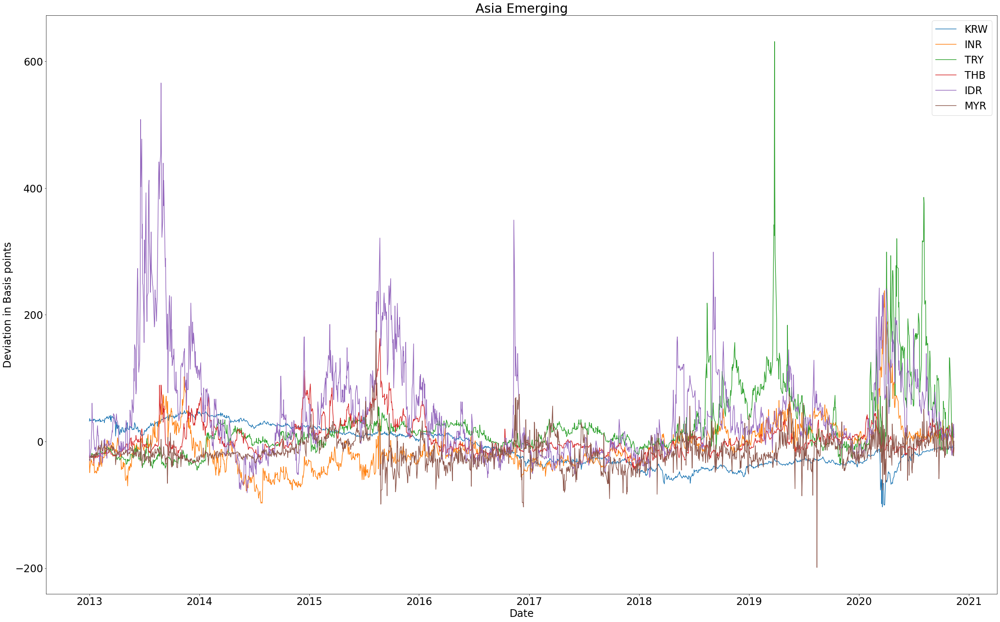

In [120]:
plots = [developped, americas, europe_africa, asia]
titles = ["Developped","Americas Emerging", "Europe & Africa Emerging", "Asia Emerging"]
acc = 0

for i in plots:
    plt.figure(figsize=(40,25))
    for columns in deviations:
        if columns != "Date":
            if columns in i:
                plt.plot(deviations["Date"],deviations[columns])
                plt.title(titles[acc], fontsize = 30)
                plt.xlabel('Date', fontsize = 24)
                plt.ylabel('Deviation in Basis points', fontsize= 24)
                plt.xticks(fontsize = 24)
                plt.yticks(fontsize = 24)
                plt.legend(i,fontsize = 24)
    acc += 1

Developped countries differ in their magnitude of deviation but generally follow a trend together. Emerging countries deviate in different directions suggesting more idiosyncratic reasons for deviation. We can check the correlation matrix of developped countries and emerging countries

In [121]:
deviations[developped].corr()

,EUR,JPY,GBP,AUD,CAD,CHF,NZD,SEK,NOK
EUR,1.000000,0.801472,0.622910,0.364757,0.500125,0.779392,-0.029092,0.587603,0.387795
JPY,0.801472,1.000000,0.695936,0.381741,0.615273,0.766188,-0.056437,0.717336,0.335776
GBP,0.622910,0.695936,1.000000,0.644078,0.848221,0.544832,0.294744,0.493250,0.652739
AUD,0.364757,0.381741,0.644078,1.000000,0.661843,0.289922,0.428974,0.310030,0.530787
CAD,0.500125,0.615273,0.848221,0.661843,1.000000,0.427842,0.187558,0.396855,0.616897
CHF,0.779392,0.766188,0.544832,0.289922,0.427842,1.000000,-0.007314,0.717845,0.327924
NZD,-0.029092,-0.056437,0.294744,0.428974,0.187558,-0.007314,1.000000,0.005273,0.454135
SEK,0.587603,0.717336,0.493250,0.310030,0.396855,0.717845,0.005273,1.000000,0.169400
NOK,0.387795,0.335776,0.652739,0.530787,0.616897,0.327924,0.454135,0.169400,1.000000


In [122]:
deviations[emerging].corr()

,MYR,COP,IDR,HUF,THB,PLN,TRY,ZAR,RUB,MXN,INR,KRW
MYR,1.000000,-0.091540,0.143296,0.170589,0.264059,0.051524,0.145716,0.048694,0.239190,-0.000835,0.060349,-0.010718
COP,-0.091540,1.000000,-0.261288,0.053525,-0.431001,-0.232110,-0.005241,-0.013909,-0.379385,0.042140,-0.155984,-0.135460
IDR,0.143296,-0.261288,1.000000,0.034868,0.430760,-0.145479,0.062843,0.248265,0.132785,-0.184307,0.412840,0.197011
HUF,0.170589,0.053525,0.034868,1.000000,0.184125,0.194097,0.292984,0.111437,0.010506,0.269245,0.059290,-0.053688
THB,0.264059,-0.431001,0.430760,0.184125,1.000000,-0.091892,0.030405,0.104920,0.551989,-0.252891,0.013056,0.332811
PLN,0.051524,-0.232110,-0.145479,0.194097,-0.091892,1.000000,0.101391,0.111917,-0.104458,0.349956,0.188288,-0.231483
TRY,0.145716,-0.005241,0.062843,0.292984,0.030405,0.101391,1.000000,0.081095,-0.120316,0.426729,0.343760,-0.365174
ZAR,0.048694,-0.013909,0.248265,0.111437,0.104920,0.111917,0.081095,1.000000,-0.088387,-0.000340,0.270012,0.181670
RUB,0.239190,-0.379385,0.132785,0.010506,0.551989,-0.104458,-0.120316,-0.088387,1.000000,-0.380124,-0.237927,0.448400
MXN,-0.000835,0.042140,-0.184307,0.269245,-0.252891,0.349956,0.426729,-0.000340,-0.380124,1.000000,0.336239,-0.671675


A quick skim confirms what we saw in the graph that deviations in developped countries are much more correlated than deviations in emerging countries.

### Check for normality

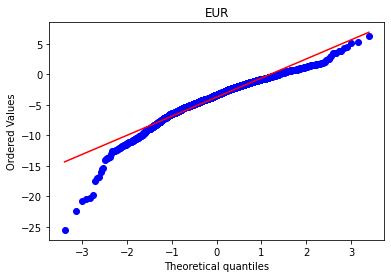

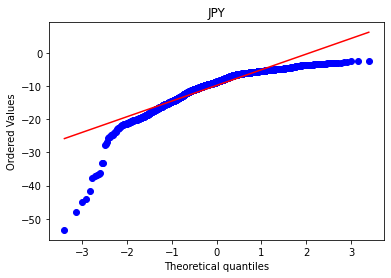

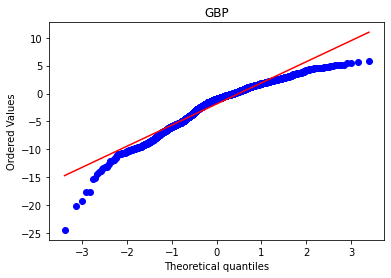

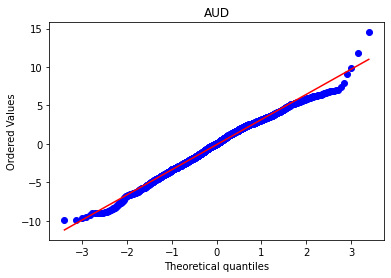

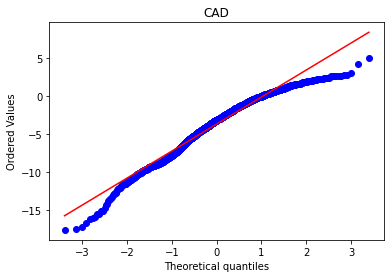

...

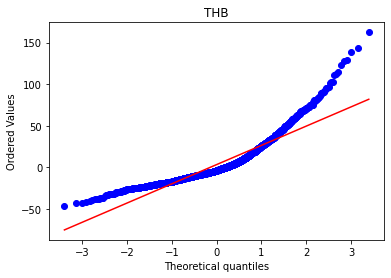

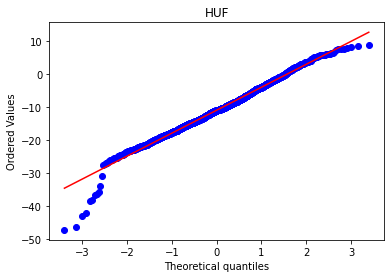

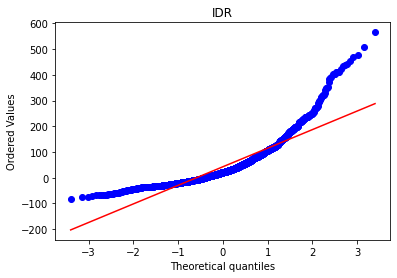

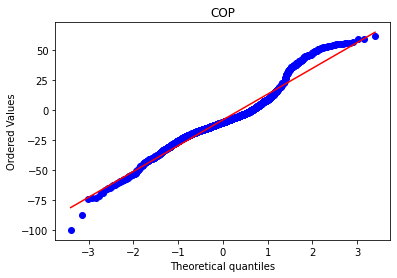

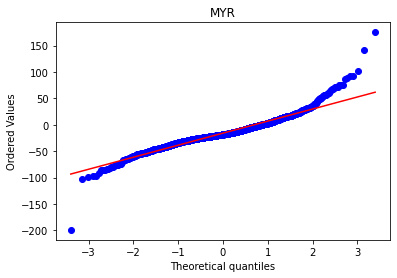

In [123]:
for columns in [col for col in deviations.columns if "Date" not in col]:
    sp.stats.probplot(deviations[columns].dropna(), dist="norm", plot=py)
    py.title(columns)
    py.show()

The power of my t-test will be limited due the the non-normality of some of the country deviations. 

### One sample T-Tests

In [124]:
for columns in [col for col in deviations.columns if "Date" not in col]:

    print(columns)
    print(sp.stats.ttest_1samp(deviations[columns].dropna(),0))
    print(np.mean(deviations[columns]))

EUR
Ttest_1sampResult(statistic=-52.731005114934575, pvalue=0.0)
-3.737455924416296
JPY
Ttest_1sampResult(statistic=-87.68099239662773, pvalue=0.0)
-9.850933406093828
GBP
Ttest_1sampResult(statistic=-21.774859631980547, pvalue=9.550480494916165e-95)
-1.8604312053989798
AUD
Ttest_1sampResult(statistic=-1.3647597559995952, pvalue=0.17247819840463488)
-0.09860222960295253
CAD
Ttest_1sampResult(statistic=-45.908511869891676, pvalue=3.4769376e-317)
-3.648949330757046
CHF
Ttest_1sampResult(statistic=-91.29397185444519, pvalue=0.0)
-9.368069124383073
NZD
Ttest_1sampResult(statistic=47.342132492724645, pvalue=0.0)
4.258186141770283
SEK
Ttest_1sampResult(statistic=-15.117461890214202, pvalue=4.911476066733493e-49)
-2.114579014149888
NOK
Ttest_1sampResult(statistic=3.4362114348189023, pvalue=0.0006016580952054338)
0.295761150052532
KRW
Ttest_1sampResult(statistic=-12.33619322558858, pvalue=8.822381309265633e-34)
-8.38531878383527
INR
Ttest_1sampResult(statistic=-12.149560241287103, pvalue=7.5239

### Wilcoxon Sign Ranked Test

In [125]:
for columns in [col for col in deviations.columns if "Date" not in col]:
    print(columns)
    print(sp.stats.wilcoxon(deviations[columns].dropna()))
    print(np.mean(deviations[columns]))

EUR
WilcoxonResult(statistic=52612.0, pvalue=2.7795389781021963e-304)
-3.737455924416296
JPY
WilcoxonResult(statistic=0.0, pvalue=0.0)
-9.850933406093828
GBP
WilcoxonResult(statistic=582245.0, pvalue=4.2066438410790207e-69)
-1.8604312053989798
AUD
WilcoxonResult(statistic=1043640.0, pvalue=0.6938132042598744)
-0.09860222960295253
CAD
WilcoxonResult(statistic=128897.0, pvalue=5.154363302223784e-260)
-3.648949330757046
CHF
WilcoxonResult(statistic=5.0, pvalue=0.0)
-9.368069124383073
NZD
WilcoxonResult(statistic=118902.0, pvalue=1.292103169093302e-265)
4.258186141770283
SEK
WilcoxonResult(statistic=710729.0, pvalue=1.94578221561375e-37)
-2.114579014149888
NOK
WilcoxonResult(statistic=993242.0, pvalue=0.023219051653566275)
0.295761150052532
KRW
WilcoxonResult(statistic=720909.0, pvalue=2.3728304615206873e-35)
-8.38531878383527
INR
WilcoxonResult(statistic=626705.0, pvalue=5.019749173054833e-57)
-9.455414555464072
MXN
WilcoxonResult(statistic=600810.0, pvalue=6.470531426273125e-64)
-4.27473

### Two-sample test with unequal variance

In [126]:
#print("Emerging market deviation variance: " + str(round(np.var(deviations["Emerging"]),2)))
#print("Developped market deviation variance: " + str(round(np.var(deviations["Developped"]),2)))

In [127]:
#print(sp.stats.ttest_ind(deviations["Emerging"],deviations["Developped"],equal_var=False))
#print(round(np.mean(deviations["Emerging"]),2))
#print(round(np.mean(deviations["Developped"]),2))

Suppose we did not care about the direction of deviation and want to compare the magnitude of deviation between emerging and developped markets

In [128]:
#deviations["Emerging Magnitude"] = 0
#deviations["Developped Magnitude"] = 0

#for columns in deviations:
#        if columns in emerging:
#            deviations["Emerging Magnitude"] += abs(deviations[columns])/len(emerging)
#        elif columns in developped:
#            deviations["Developped Magnitude"] += abs(deviations[columns])/len(developped)

#print("Emerging market deviation variance: " + str(np.var(deviations["Emerging Magnitude"])))
#print("Developped market deviation variance: " + str(np.var(deviations["Developped Magnitude"])))

In [129]:
#print(sp.stats.ttest_ind(deviations["Emerging Magnitude"],deviations["Developped Magnitude"],equal_var=False))
#print(round(np.mean(deviations["Emerging Magnitude"]),2))
#print(round(np.mean(deviations["Developped Magnitude"]),2))

### Autoregression

Using autogression to see if deviation has any predictive power on forward premium.

$y_{it} = \alpha_1y_{it-1} + ... + \beta_1x_{it-1} + ... + \epsilon_{it}$ where $y_{it} = \frac{f_{it}}{s_{it}}$ and  $x_{it}$ = CIP deviation of currency i at time t. And $s_{it}$ is the spot exchange rate quoted as currency i per USD.

D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


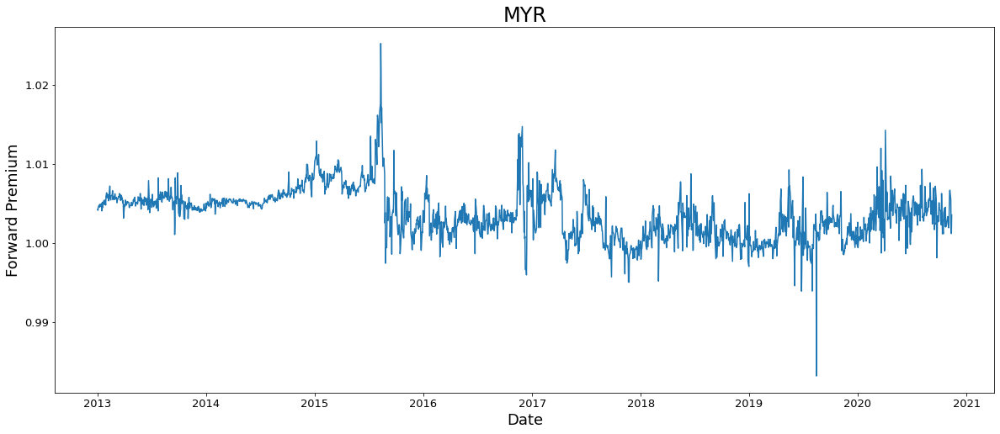

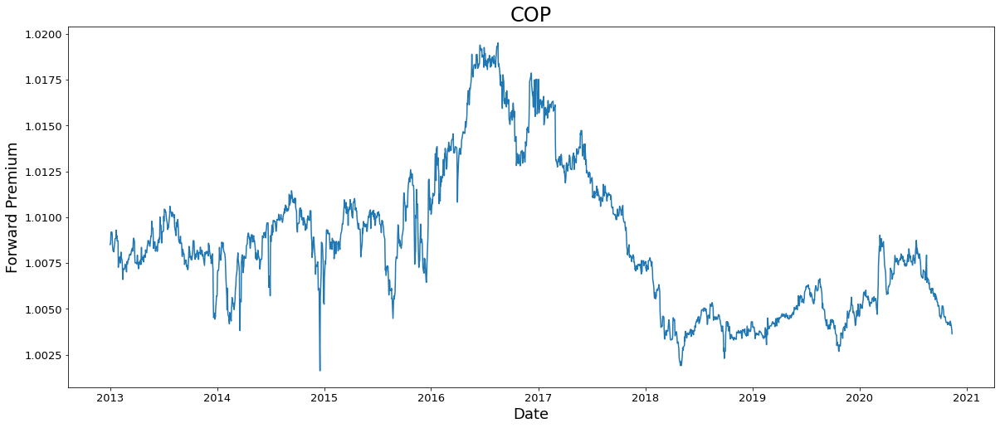

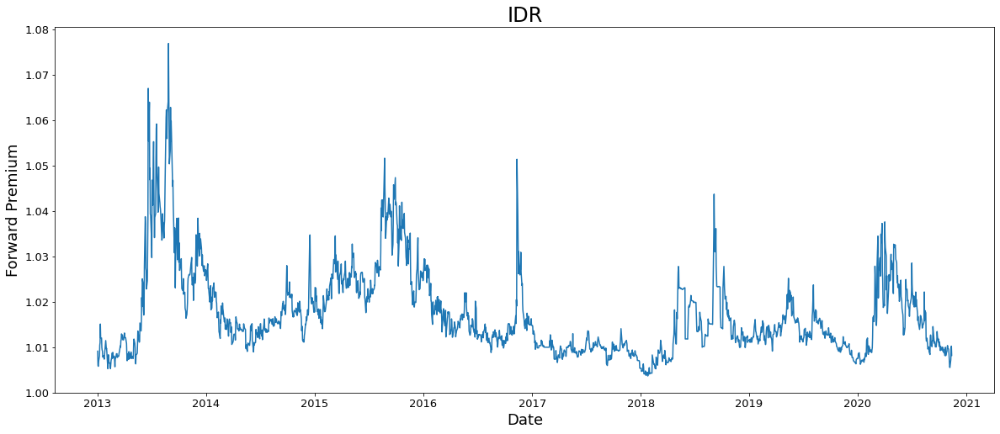

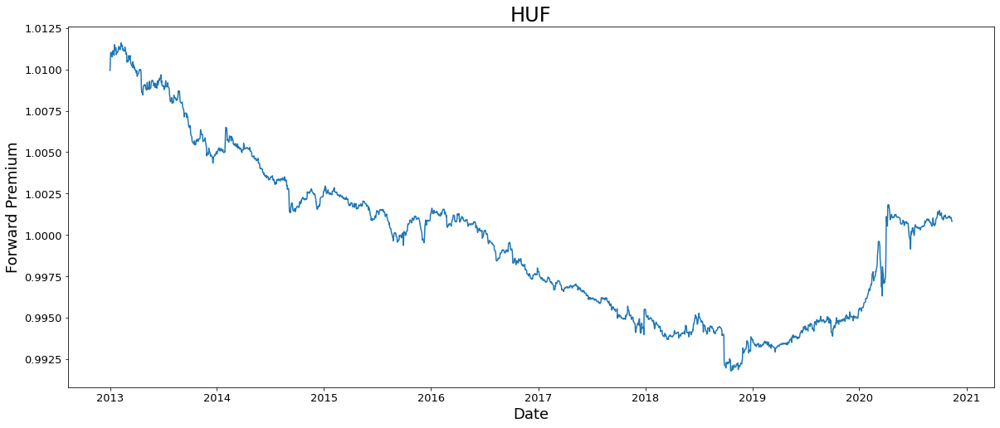

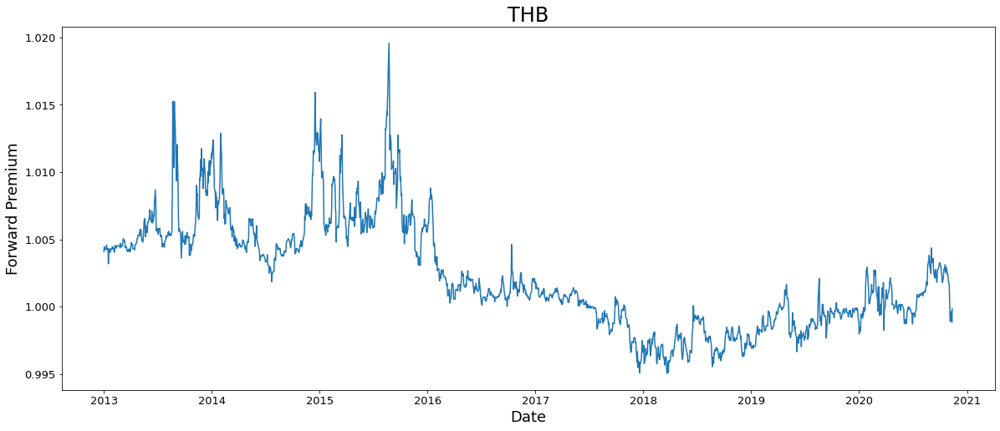

...

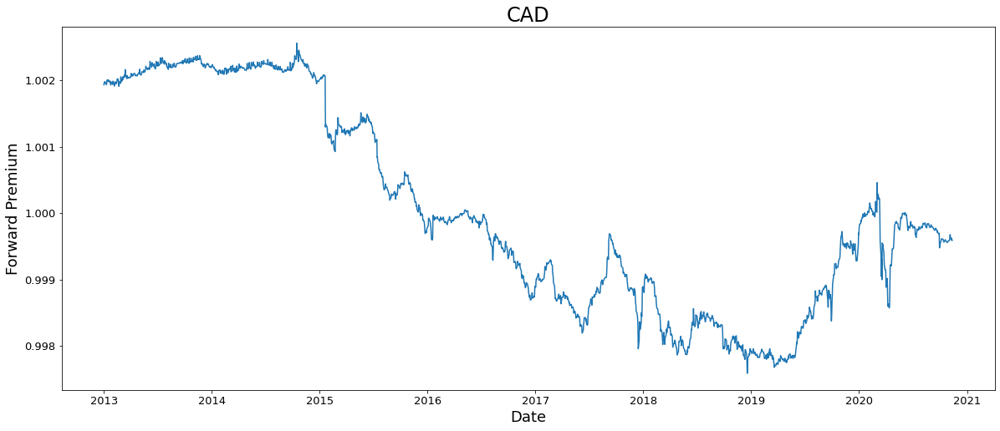

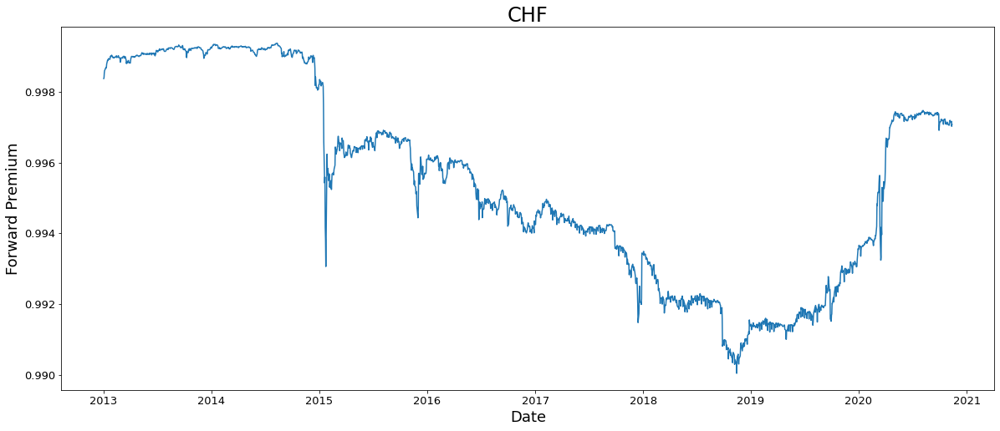

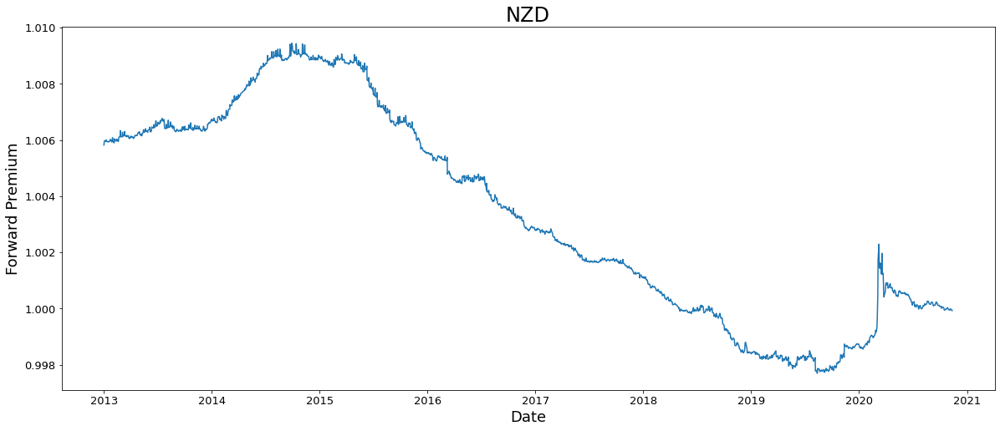

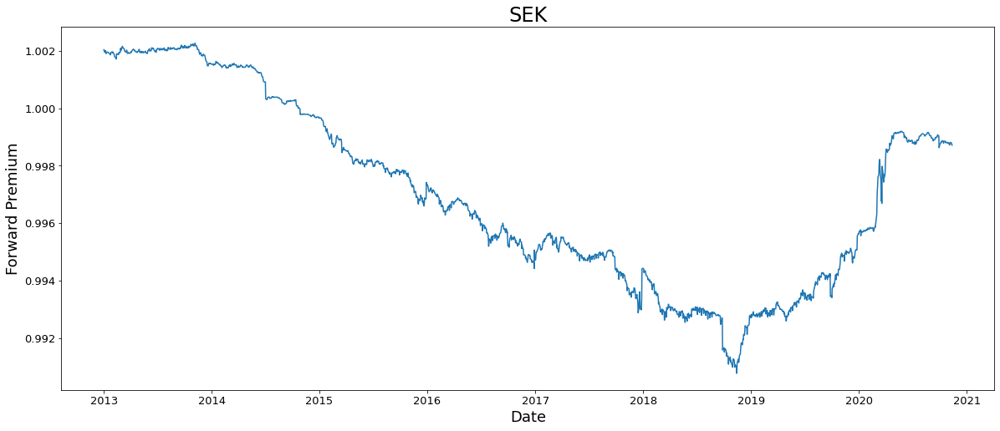

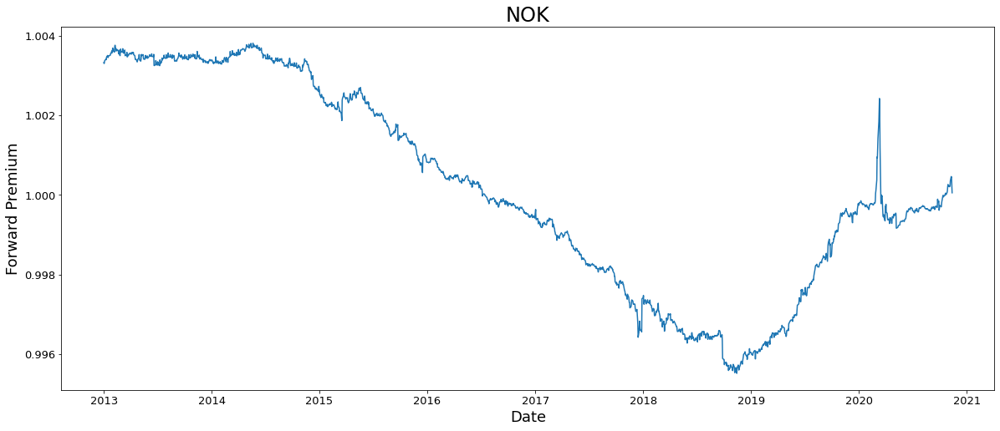

In [130]:
horizon = "3M"
df_forward_premium = fx.copy()
df_forward_premium = df_forward_premium[df_forward_premium["Date"] > pd.to_datetime(cutoff_date)]

for c in country:
    df_forward_premium["f"+ c] = df_forward_premium[c+horizon]/df_forward_premium[c]
    plt.figure(figsize=(20,8))
    plt.plot(df_forward_premium["Date"],df_forward_premium["f"+ c])
    plt.title(c, fontsize = 24)
    plt.xlabel('Date', fontsize = 18)
    plt.ylabel('Forward Premium', fontsize= 18)
    plt.xticks(fontsize = 13)
    plt.yticks(fontsize = 13)  
    
df_forward_premium = df_forward_premium[["Date"] + ["f"+ c for c in country]]

Time series for financial data is typically stochastic or has a trend that is not stationary. To be able to estimate a VAR model using the data, I have to ensure stationarity. If the data used contains a unit, it will be difficult to estimate a model because the data will not flucuate around a mean. 

I start by an augmented Dickey-Fuller Test for $y_{i}, x_{i} \forall i \in $ {Countries}. The test will assume the null hypothsis that each times series possesses a unit root and thus is non-stationary. I would reject the null hypothesis in favor of the alternative hypothesis that the time series is stationary if the p-value < 0.05.

In [131]:
from statsmodels.tsa.stattools import adfuller

df_ts = deviations[["Date"] + country].merge(df_forward_premium, on = "Date")
df_ts.set_index('Date', inplace=True)

for columns in df_ts:
    print(columns + " p-value: " + str(round(adfuller(df_ts[columns], autolag='AIC')[1],2)),)

MYR p-value: 0.0
COP p-value: 0.01
IDR p-value: 0.0
HUF p-value: 0.0
THB p-value: 0.0
PLN p-value: 0.0
TRY p-value: 0.01
ZAR p-value: 0.0
RUB p-value: 0.02
MXN p-value: 0.04
INR p-value: 0.0
KRW p-value: 0.45
EUR p-value: 0.0
JPY p-value: 0.0
GBP p-value: 0.02
AUD p-value: 0.01
CAD p-value: 0.0
CHF p-value: 0.0
NZD p-value: 0.03
SEK p-value: 0.09
NOK p-value: 0.0
fMYR p-value: 0.0
fCOP p-value: 0.4
fIDR p-value: 0.0
fHUF p-value: 0.06
fTHB p-value: 0.2
fPLN p-value: 0.05
fTRY p-value: 0.28
fZAR p-value: 0.64
fRUB p-value: 0.3
fMXN p-value: 0.75
fINR p-value: 0.0
fKRW p-value: 0.54
fEUR p-value: 0.7
fJPY p-value: 0.74
fGBP p-value: 0.76
fAUD p-value: 0.75
fCAD p-value: 0.6
fCHF p-value: 0.61
fNZD p-value: 0.9
fSEK p-value: 0.55
fNOK p-value: 0.61


For some of the time series we fail to reject the null hypothesis that there is a unit root, thus I will detrend the data by taking the first difference. For consistency I will apply the first difference to all countries.

D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


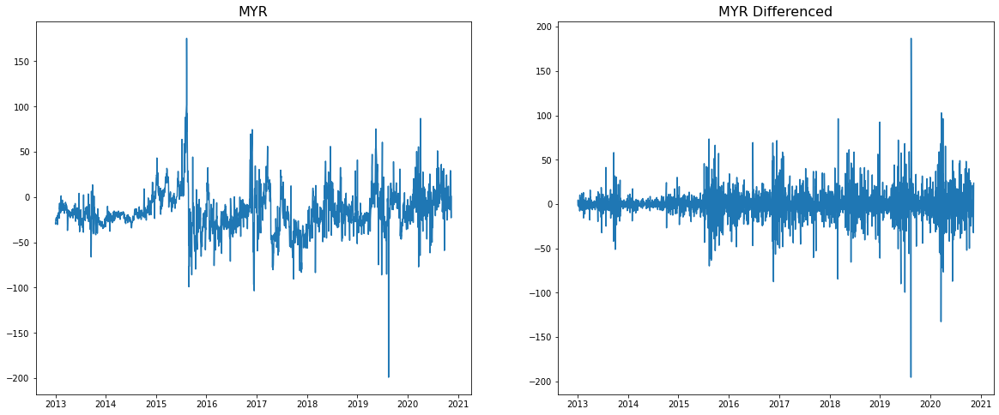

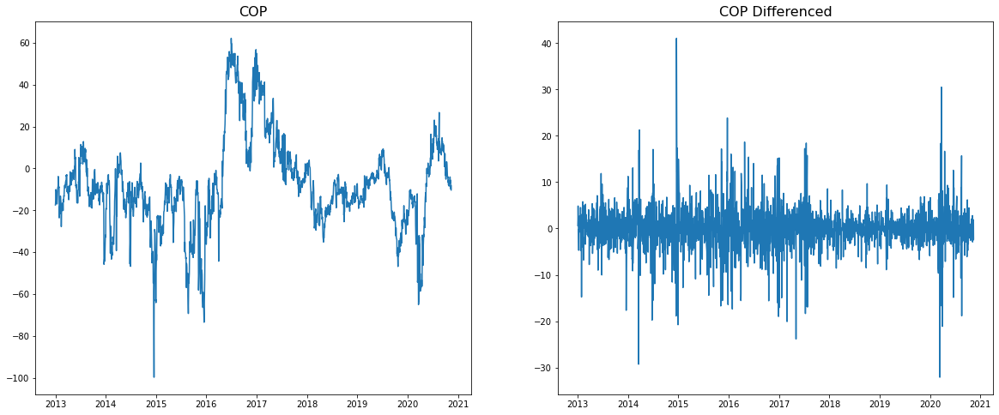

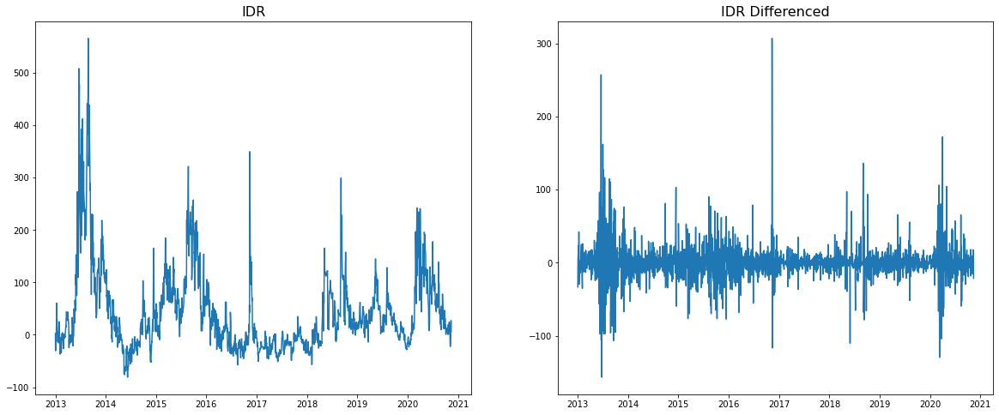

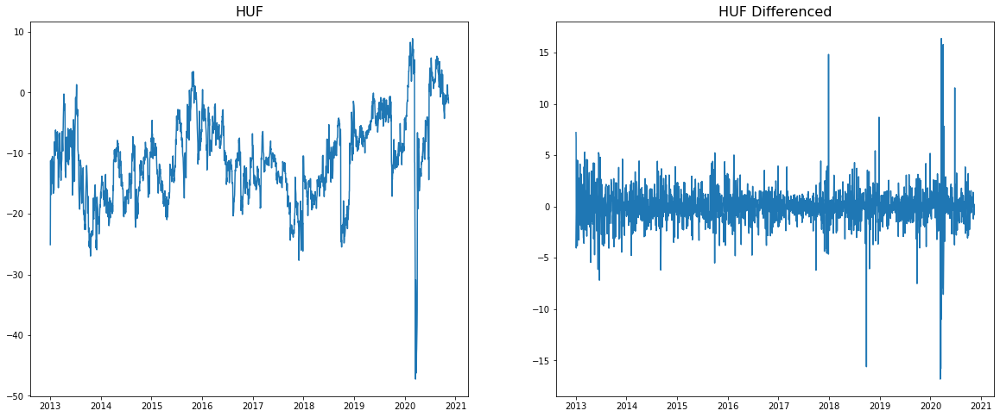

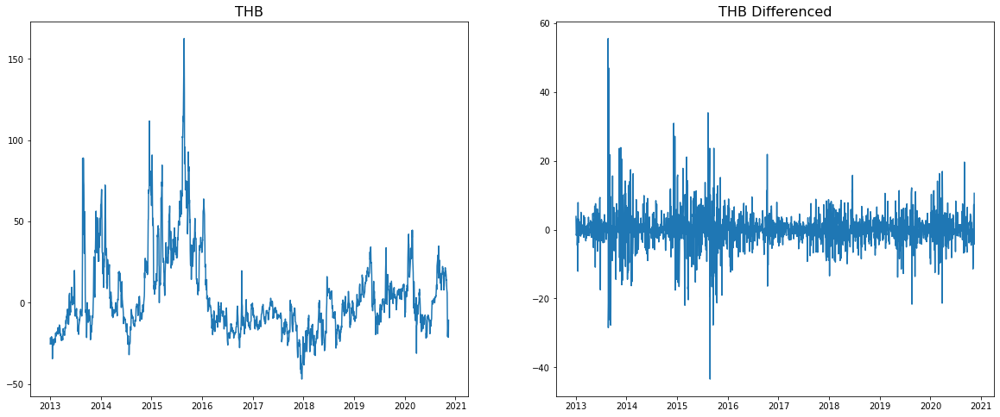

...

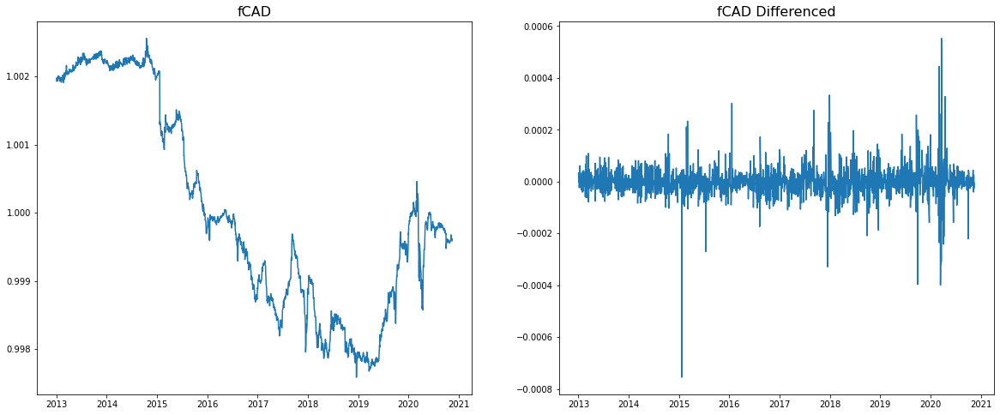

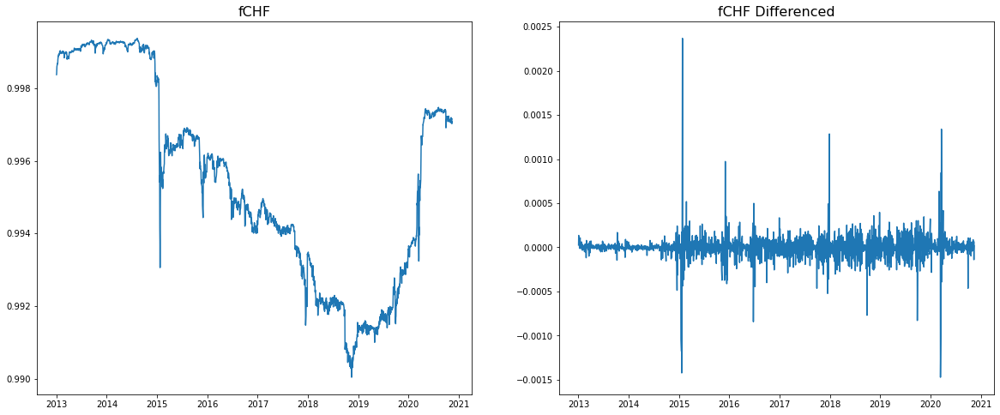

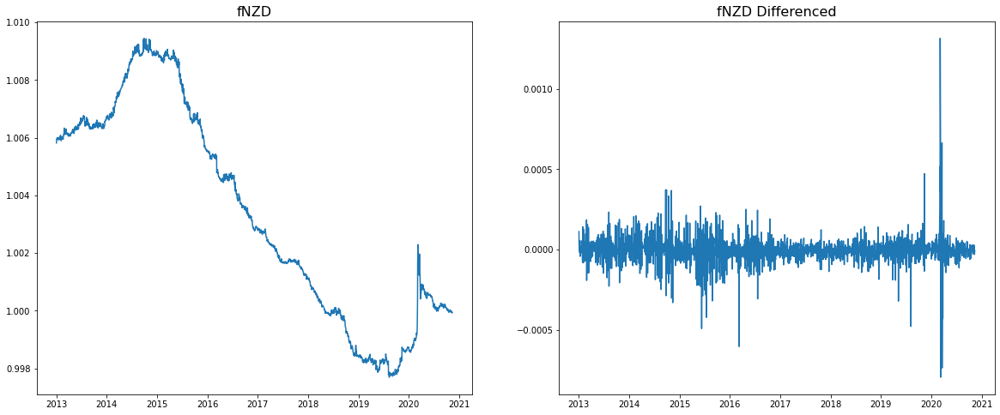

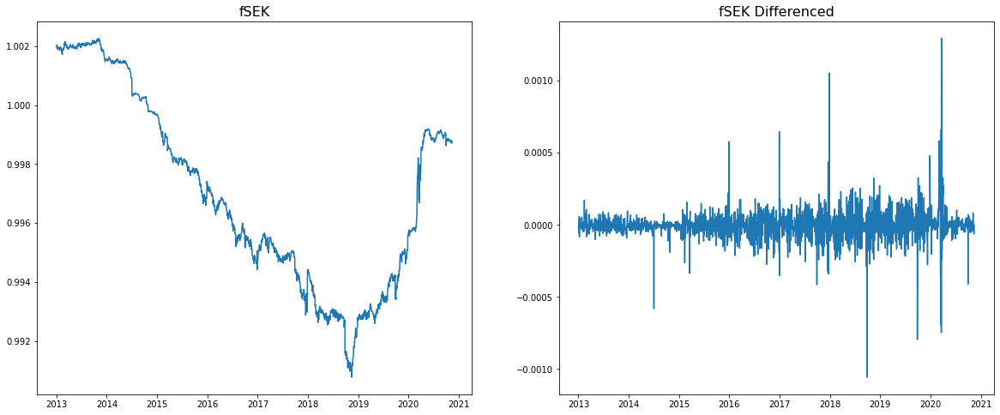

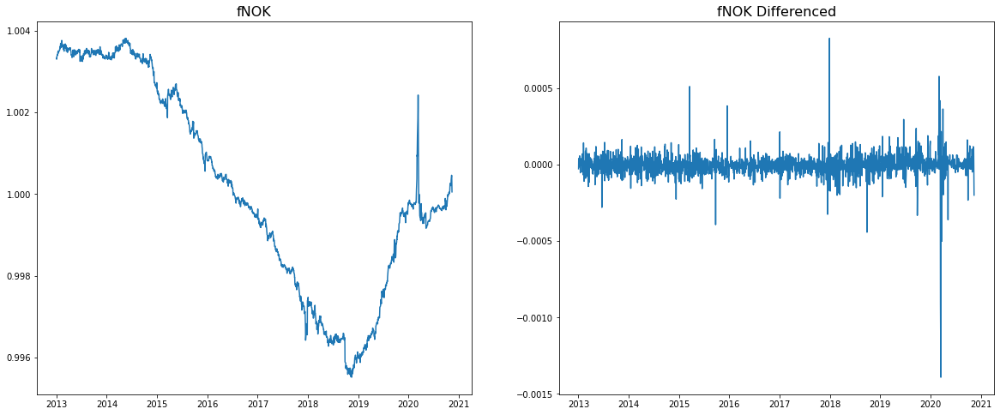

In [132]:
df_diff = df_ts.copy()
#remove first column of NaNs
df_diff = df_diff.diff()[1:]


for columns in df_diff:
    plt.figure(figsize=(20,8))
    
    plt.subplot(1, 2, 1)
    plt.plot(df_ts[columns])
    plt.title(columns, fontsize=16)
    
    plt.subplot(1, 2, 2)
    plt.plot(df_diff[columns])
    plt.title(columns+" Differenced", fontsize=16)

ADF test on first differenced data

In [133]:
for columns in df_diff:
    if columns != "Date":
        print(columns + " p-value: " + str(round(adfuller(df_diff[columns], autolag='AIC')[1],2)))

MYR p-value: 0.0
COP p-value: 0.0
IDR p-value: 0.0
HUF p-value: 0.0
THB p-value: 0.0
PLN p-value: 0.0
TRY p-value: 0.0
ZAR p-value: 0.0
RUB p-value: 0.0
MXN p-value: 0.0
INR p-value: 0.0
KRW p-value: 0.0
EUR p-value: 0.0
JPY p-value: 0.0
GBP p-value: 0.0
AUD p-value: 0.0
CAD p-value: 0.0
CHF p-value: 0.0
NZD p-value: 0.0
SEK p-value: 0.0
NOK p-value: 0.0
fMYR p-value: 0.0
fCOP p-value: 0.0
fIDR p-value: 0.0
fHUF p-value: 0.0
fTHB p-value: 0.0
fPLN p-value: 0.0
fTRY p-value: 0.0
fZAR p-value: 0.0
fRUB p-value: 0.0
fMXN p-value: 0.0
fINR p-value: 0.0
fKRW p-value: 0.0
fEUR p-value: 0.0
fJPY p-value: 0.0
fGBP p-value: 0.0
fAUD p-value: 0.0
fCAD p-value: 0.0
fCHF p-value: 0.0
fNZD p-value: 0.0
fSEK p-value: 0.0
fNOK p-value: 0.0


Autocorrelation plots

D:\Anaconda\envs\tf\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


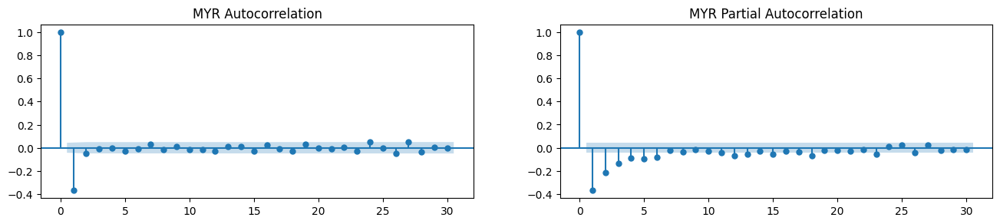

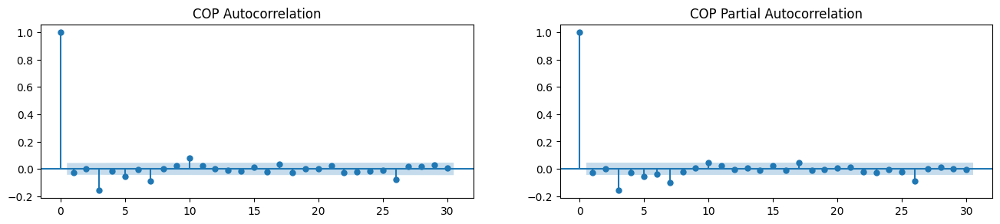

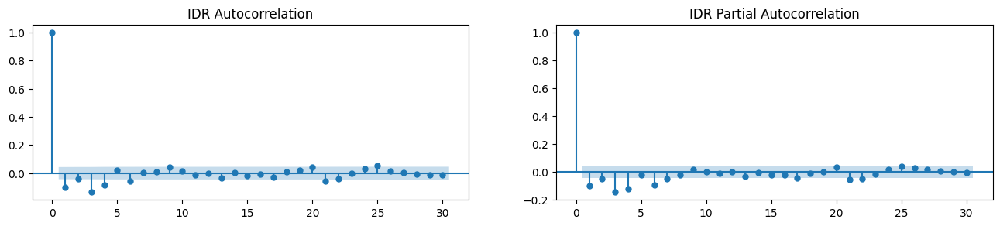

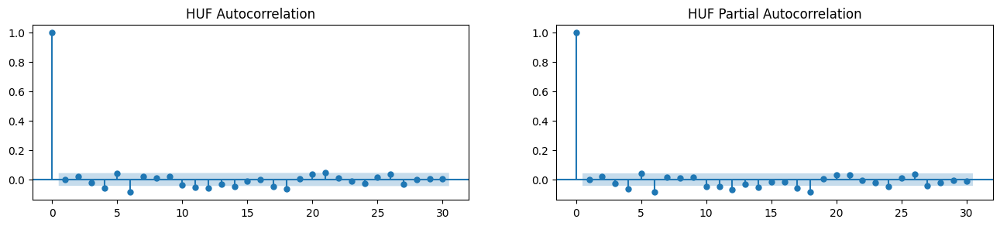

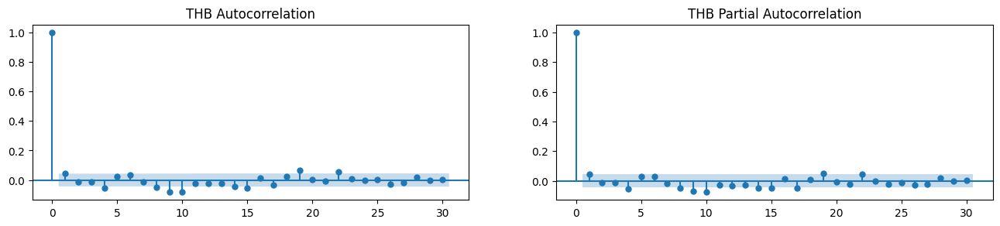

...

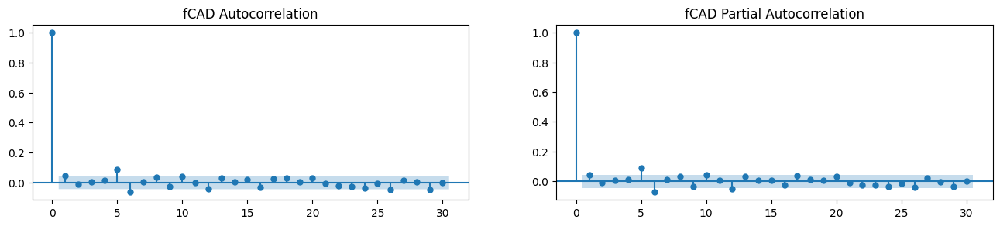

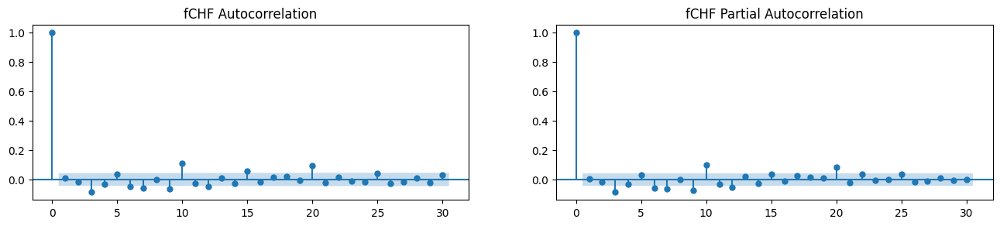

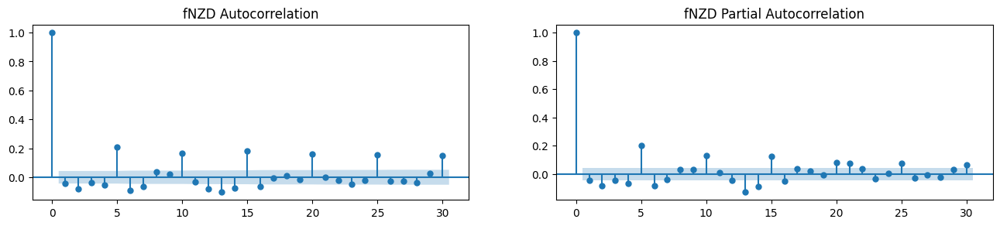

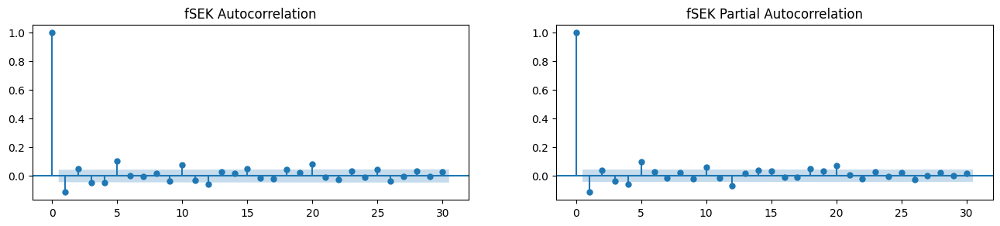

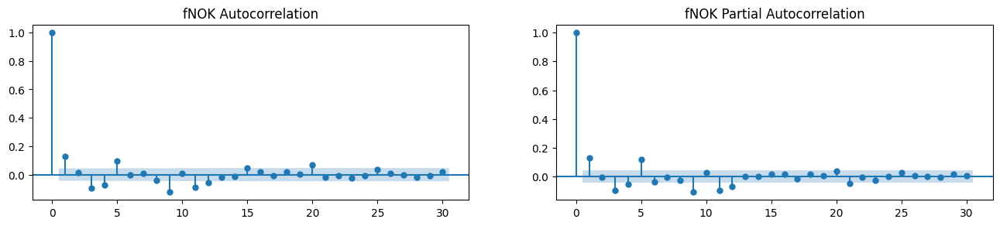

In [134]:
from statsmodels.tsa.stattools import acf, pacf, grangercausalitytests
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

for columns in df_diff:
    fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
    plot_acf(df_diff[columns].tolist(), lags=30, ax=axes[0],title = columns + " Autocorrelation")
    plot_pacf(df_diff[columns].tolist(), lags=30, ax=axes[1], title = columns + " Partial Autocorrelation")

Granger Causality

In [135]:
maxlag=10

def grangers_causality_matrix(X_train, variables, test = 'ssr_chi2test', verbose=False):
    dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in dataset.columns:
        for r in dataset.index:
            test_result = grangercausalitytests(X_train[[r,c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            dataset.loc[r,c] = min_p_value
    dataset.columns = [var + '_x' for var in variables]
    dataset.index = [var + '_y' for var in variables]
    return dataset
for c in country:
    print(grangers_causality_matrix(df_diff[[c,"f"+c]], variables = df_diff[[c,"f"+c]].columns))

        MYR_x  fMYR_x
MYR_y     1.0     0.0
fMYR_y    0.0     1.0
        COP_x  fCOP_x
COP_y   1.000     0.0
fCOP_y  0.114     1.0
         IDR_x  fIDR_x
IDR_y   1.0000  0.0162
fIDR_y  0.0204  1.0000
        HUF_x  fHUF_x
HUF_y     1.0     0.0
fHUF_y    0.0     1.0
         THB_x  fTHB_x
THB_y   1.0000   0.055
fTHB_y  0.1168   1.000
        PLN_x  fPLN_x
PLN_y     1.0     0.0
fPLN_y    0.0     1.0
         TRY_x  fTRY_x
TRY_y   1.0000     0.0
fTRY_y  0.0002     1.0
        ZAR_x  fZAR_x
ZAR_y     1.0     0.0
fZAR_y    0.0     1.0
        RUB_x  fRUB_x
RUB_y     1.0     0.0
fRUB_y    0.0     1.0
        MXN_x  fMXN_x
MXN_y     1.0     0.0
fMXN_y    0.0     1.0
        INR_x  fINR_x
INR_y     1.0     0.0
fINR_y    0.0     1.0
         KRW_x  fKRW_x
KRW_y   1.0000     0.0
fKRW_y  0.0007     1.0
        EUR_x  fEUR_x
EUR_y     1.0     0.0
fEUR_y    0.0     1.0
        JPY_x  fJPY_x
JPY_y     1.0     0.0
fJPY_y    0.0     1.0
        GBP_x  fGBP_x
GBP_y     1.0     0.0
fGBP_y    0.0     1.

D:\Anaconda\envs\tf\lib\site-packages\statsmodels\base\model.py:1834: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)


        NOK_x  fNOK_x
NOK_y     1.0     0.0
fNOK_y    0.0     1.0


Lag selection 

In [136]:
from statsmodels.tsa.api import VAR


for c in country:
    model = VAR(df_diff[[c,"f"+c]],freq="B")
    results = model.fit(10)
    print(model.select_order(10))

<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 9, BIC -> 3, FPE -> 9, HQIC -> 6>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 10, BIC -> 3, FPE -> 10, HQIC -> 7>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 10, BIC -> 4, FPE -> 10, HQIC -> 6>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 8, BIC -> 3, FPE -> 8, HQIC -> 7>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 10, BIC -> 0, FPE -> 10, HQIC -> 0>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 10, BIC -> 0, FPE -> 10, HQIC -> 2>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 10, BIC -> 2, FPE -> 10, HQIC -> 10>
<statsmodels.tsa.vector_ar.var_model.LagOrderResults object. Selected orders are: AIC -> 10, BIC -> 6, FPE -> 10, HQIC -> 9>
<st

D:\Anaconda\envs\tf\lib\site-packages\statsmodels\tsa\vector_ar\plotting.py:209: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  squeeze=False, figsize=figsize)


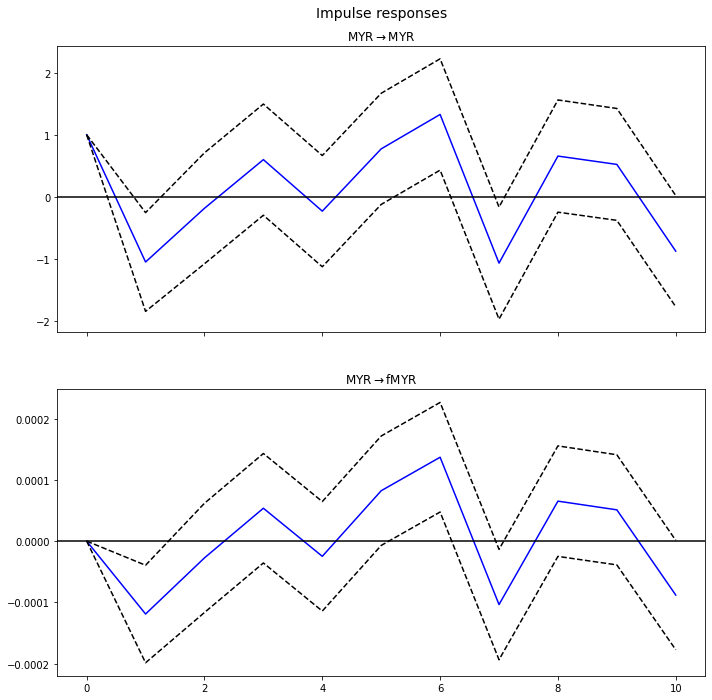

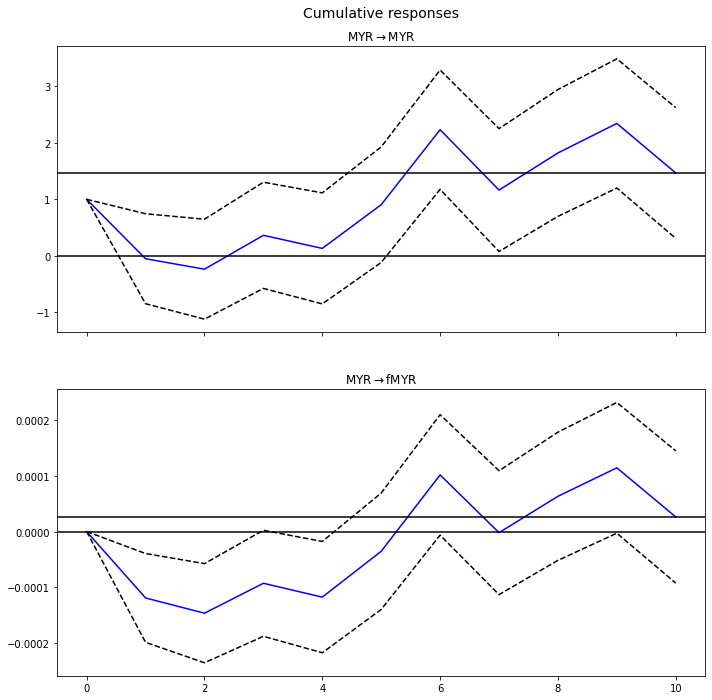

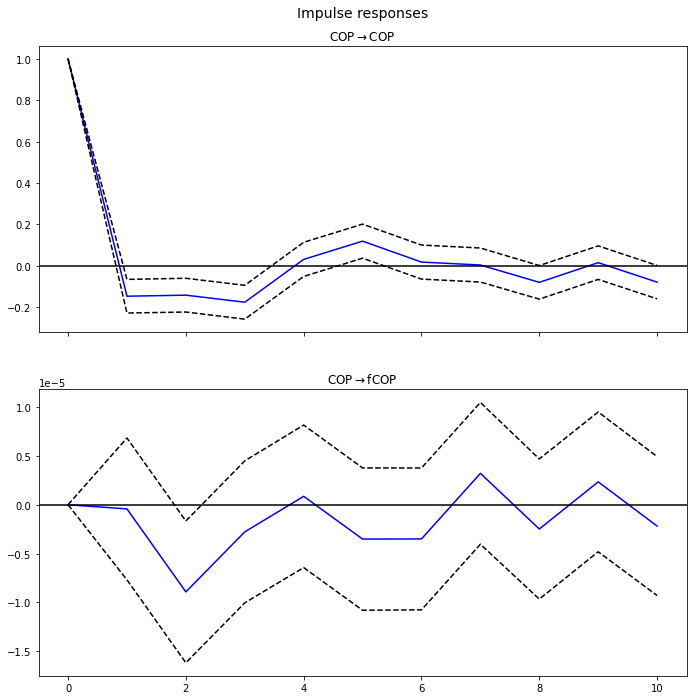

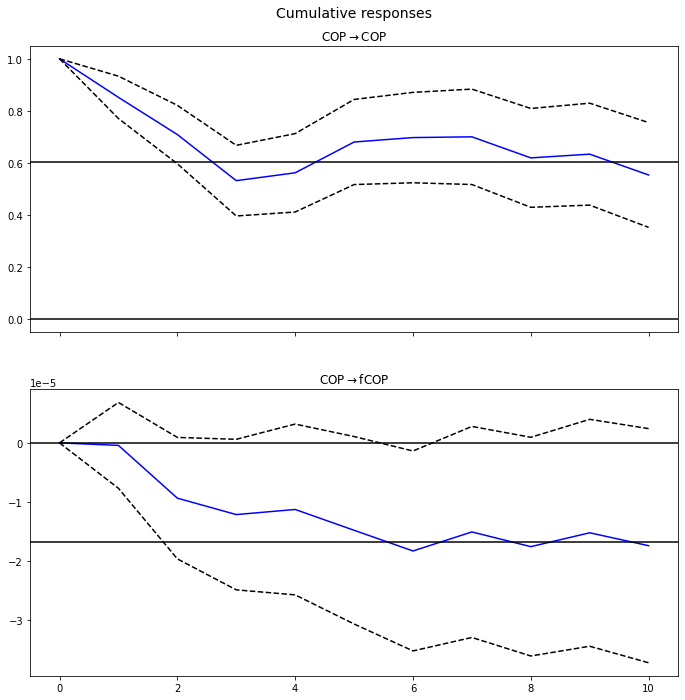

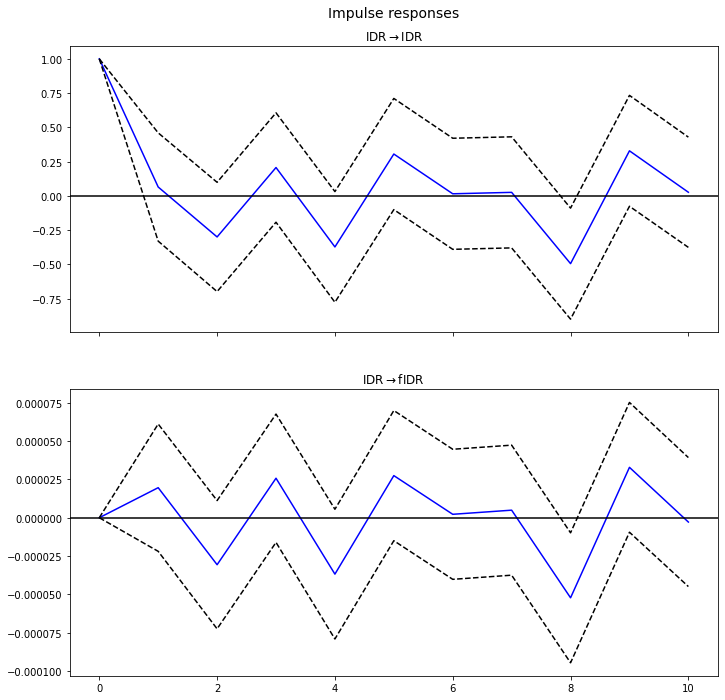

...

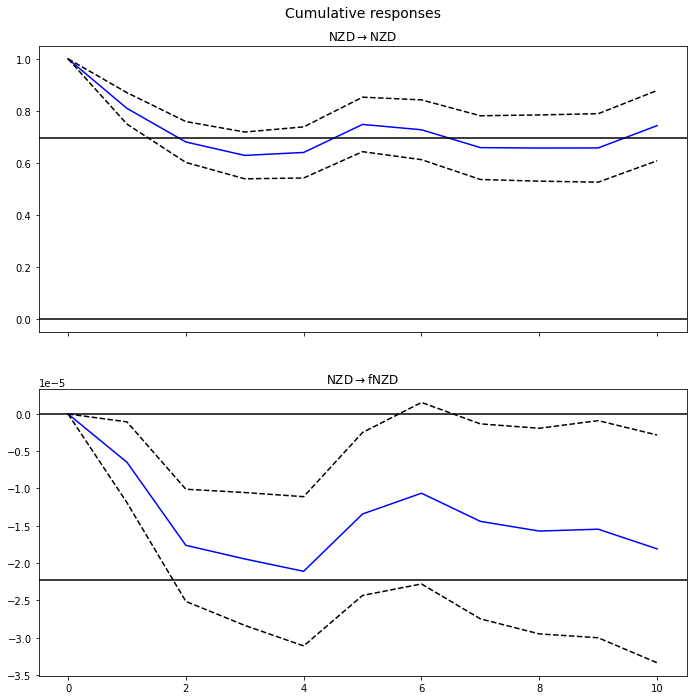

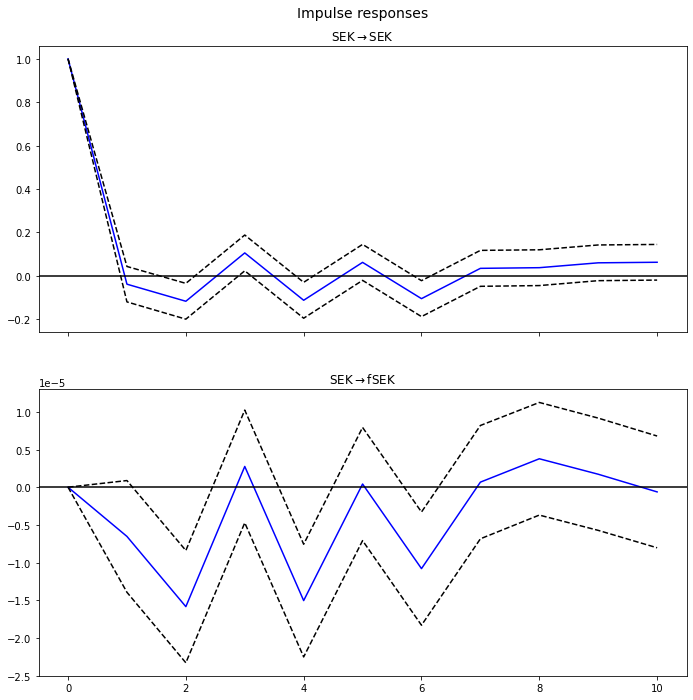

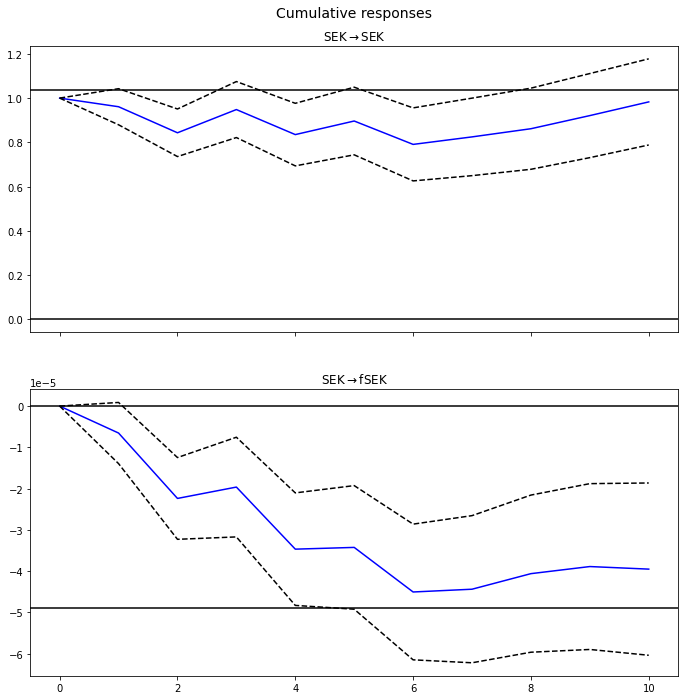

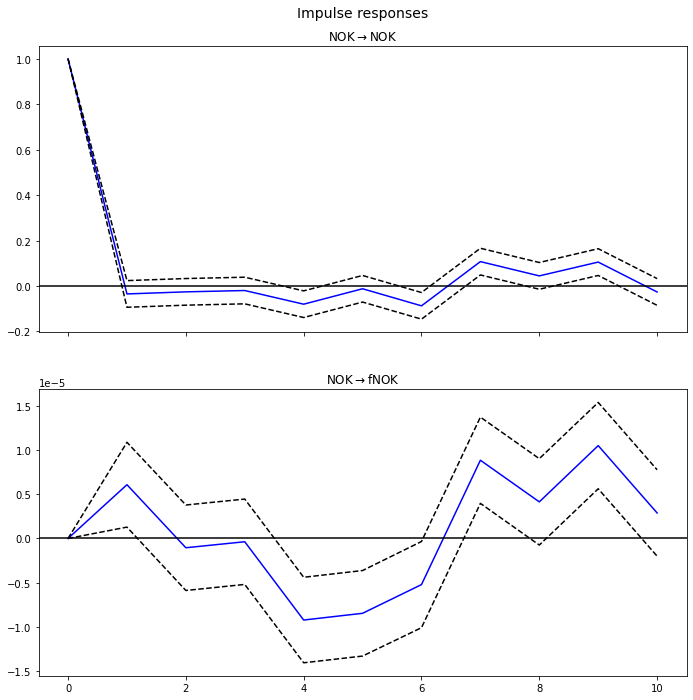

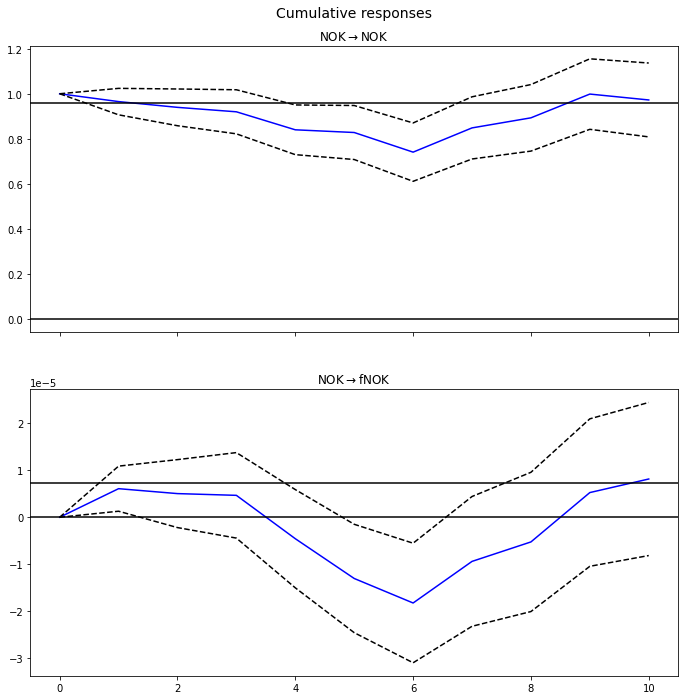

In [138]:
for c in country:
    model = VAR(df_diff[[c,"f"+c]],freq="B")
    results = model.fit(10)
    #print(results.summary())
    #print(model.select_order(5))
    irf = results.irf(10)
    irf.plot(impulse=c)
    irf.plot_cum_effects(impulse=c)